In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


# Label Columns
only run this once to permanently label all columns in folder

In [ ]:
import os
import pandas as pd

folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Classified Data (3 Sensors)'

# Get a list of all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Loop through each CSV file
for csv_file in csv_files:
  file_path = os.path.join(folder_path, csv_file)
  df = pd.read_csv(file_path)
  df.columns = ['quat_W', 'quat_X', 'quat_Y', 'quat_Z', 'gyro_X','gyro_Y','gyro_Z', 'linearAccel_x', 'linearAccel_y', 'linearAccel_z', 'Time']

  df.to_csv(file_path, index=False)

# Cut off quat data
only run this once to permanently remove first 4 columns of quat data.


In [ ]:
import os
import pandas as pd

folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/IMU_Data_Classification_session3'

# Get a list of all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Loop through each CSV file
for csv_file in csv_files:
    # Read the CSV file into a pandas DataFrame
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)

    # Drop the first 3 columns
    df = df.iloc[:, 4:]

    # Save the modified DataFrame back to the CSV file
    df.to_csv(file_path, index=False)

# Plotting Functions

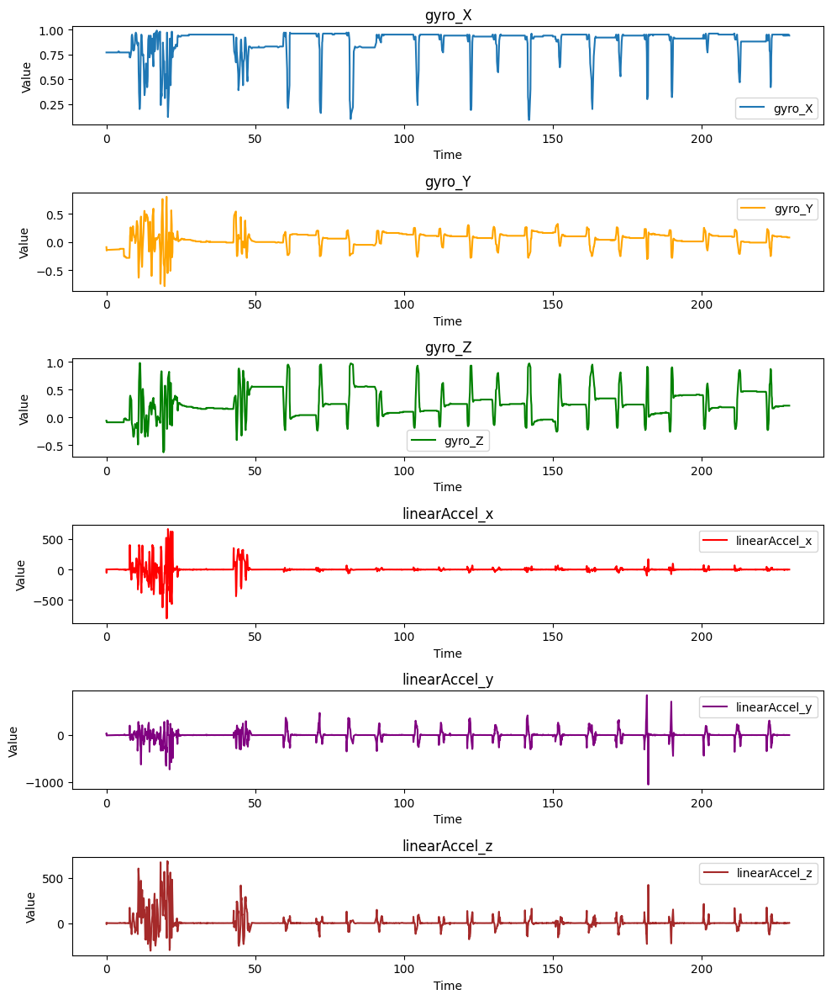

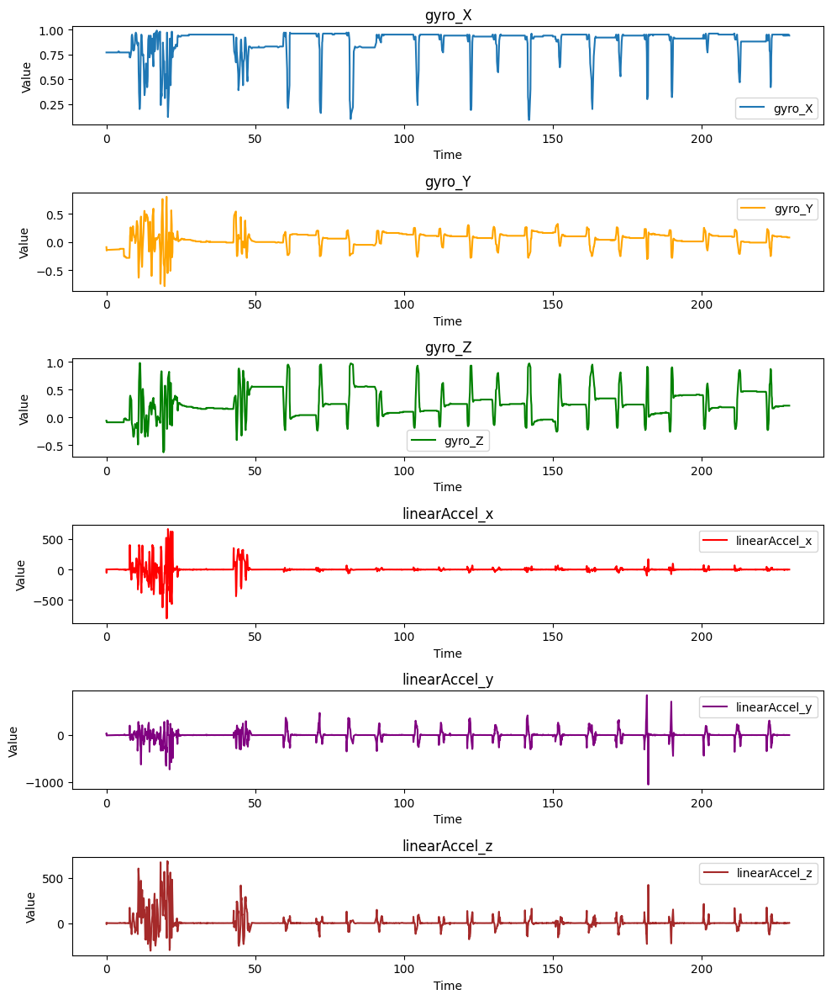

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Specify the path to the CSV file
csv_file_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/IMU_Data_Classification_session3/IMU_Data_ID61_Forearm.csv'
# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

def plot_all_data(df):
  # Create subplots
  fig, (ax1, ax2, ax3, ax4, ax5, ax6) = plt.subplots(6, 1, figsize=(10, 12))

  # Plot for the first column
  ax1.plot(df.iloc[:, 6], df.iloc[:, 0], label=df.columns[0])
  ax1.set_xlabel('Time')
  ax1.set_ylabel('Value')
  ax1.set_title(df.columns[0])
  ax1.legend()

  # Plot for the second column
  ax2.plot(df.iloc[:, 6], df.iloc[:, 1], label=df.columns[1], color='orange')
  ax2.set_xlabel('Time')
  ax2.set_ylabel('Value')
  ax2.set_title(df.columns[1])
  ax2.legend()

  # Plot for the third column
  ax3.plot(df.iloc[:, 6], df.iloc[:, 2], label=df.columns[2], color='green')
  ax3.set_xlabel('Time')
  ax3.set_ylabel('Value')
  ax3.set_title(df.columns[2])
  ax3.legend()

  ax4.plot(df.iloc[:, 6], df.iloc[:, 3], label=df.columns[3], color='red')
  ax4.set_xlabel('Time')
  ax4.set_ylabel('Value')
  ax4.set_title(df.columns[3])
  ax4.legend()

  ax5.plot(df.iloc[:, 6], df.iloc[:, 4], label=df.columns[4], color='purple')
  ax5.set_xlabel('Time')
  ax5.set_ylabel('Value')
  ax5.set_title(df.columns[4])
  ax5.legend()

  ax6.plot(df.iloc[:, 6], df.iloc[:, 5], label=df.columns[5], color='brown')
  ax6.set_xlabel('Time')
  ax6.set_ylabel('Value')
  ax6.set_title(df.columns[5])
  ax6.legend()

  # Adjust layout and show the plots
  plt.tight_layout()
  plt.show()

def plot_data(data, time):
  # Create subplots
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))

  # Plot for the first column
  ax1.plot(time, data, label='data')
  ax1.set_xlabel('Time')
  ax1.set_ylabel('Value')
  ax1.legend()

def plot_data_with_segments(data, segments, time, data_type = '_', file_name = '_'):
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))

  # Plot for the first column
  ax1.plot(time, data, label=data_type)
  ax1.set_xlabel('Time')
  ax1.set_ylabel('Value')
  ax1.set_title(file_name)

  for line_x in segments:
      ax1.axvline(x=time[line_x], color='red', linestyle='--')
  ax1.legend()

plot_all_data(df)

csv_file_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/IMU_Data_Classification_session3/IMU_Data_ID61_Forearm.csv'
# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

plot_all_data(df)


# Interpolating
Make the time intervals between each sample collected by the sensor the same (0.1s)


In [ ]:
import numpy as np
from scipy.interpolate import interp1d

def interpolate_time_series(time, data, new_interval):
    """
    Interpolates data points in a time series to occur at consistent time intervals.

    Args:
        time (array-like): The original time points of the data.
        data (array-like): The corresponding data points.
        new_interval (float): The desired duration of the time intervals for interpolation.

    Returns:
        tuple: A tuple containing the interpolated data points and the corresponding time points.
    """
    # Determine the range of the new time points
    new_start = np.min(time)
    new_end = np.max(time)
    new_time = np.arange(new_start, new_end, new_interval)

    # Create an interpolation function
    interpolator = interp1d(time, data, kind='linear', fill_value="extrapolate")

    # Interpolate the data points at the new time points
    interpolated_data = interpolator(new_time)

    return interpolated_data, new_time

def preprocess_time(time_data):
    offset = time_data[0]

    for i in range(len(time_data)):
        time_data[i] = time_data[i] - offset

    return time_data

In [ ]:
import os
import shutil
import pandas as pd

main_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/IMU_Data_Classification_session3'
dest_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Interpolated'

new_interval = 0.1

files = os.listdir(main_folder)
for file in files:
  #file_path = main_folder + '/' + file
  #with open(file_path, 'r') as f:
  #      lines = f.readlines()[:-2]
  #with open(file_path, 'w') as f:
  #      f.writelines(lines)

  data = pd.read_csv(main_folder + '/' + file)
  data = data.iloc[:-2 , :]

  #get rid of the unfiltered data
  for index, row in data.iterrows():
    if('unfiltered' in str(row.values)):
      data = data.iloc[:-index,:]
      break

  #interpolate to have constant time intervals
  print(file, data.columns[0])

  #preprocess time data first
  time_data = preprocess_time(data['Time'].values)

  dummy_data, new_time = interpolate_time_series(time_data, data['gyro_X'].values, new_interval)
  interpolated_data = np.empty((len(new_time), 6))

  #preprocess imu data
  for i in range(6):
    data_array = data[data.columns[i]].values
    interpolated_temp_data, new_time = interpolate_time_series(time_data, data_array, new_interval)
    #print(interpolated_temp_data[:5])
    #print(new_time[:5])
    interpolated_data[:,i] = interpolated_temp_data

  #convert preprocessed data to csv
  preprocessed_data = np.array(interpolated_data)
  df_data = pd.DataFrame(preprocessed_data, columns=data.columns[:6])
  df_time = pd.DataFrame(new_time, columns=['Time'])

  df_combined = pd.concat([df_data, df_time], axis=1)

  output_file_path = dest_folder + '/' + file
  df_combined.to_csv(output_file_path, index=False)

IMU_Data_ID63_ShoulderEF1.csv gyro_X
IMU_Data_ID63_Wrist.csv gyro_X
IMU_Data_ID63_ShoulderLat.csv gyro_X
IMU_Data_ID63_ShoulderLat1.csv gyro_X
IMU_Data_ID63_ShoulderHor1.csv gyro_X
IMU_Data_ID63_ShoulderHor.csv gyro_X
IMU_Data_ID63_ShoulderCircle.csv gyro_X
IMU_Data_ID63_ShoulderEF.csv gyro_X
IMU_Data_ID63_ShoulderAB.csv gyro_X
IMU_Data_ID63_Forearm.csv gyro_X
IMU_Data_ID63_elbow.csv gyro_X
IMU_Data_ID62_ShoulderLat1.csv gyro_X
IMU_Data_ID62_Wrist.csv gyro_X
IMU_Data_ID63_elbow1.csv gyro_X
IMU_Data_ID62_ShoulderLat.csv gyro_X
IMU_Data_ID62_ShoulderHor1.csv gyro_X
IMU_Data_ID62_ShoulderHor.csv gyro_X
IMU_Data_ID62_ShoulderEF1.csv gyro_X
IMU_Data_ID62_ShoulderEF.csv gyro_X
IMU_Data_ID62_ShoulderCircle.csv gyro_X
IMU_Data_ID62_elbow.csv gyro_X
IMU_Data_ID62_Forearm.csv gyro_X
IMU_Data_ID62_ShoulderAB.csv gyro_X
IMU_Data_ID62_elbow1.csv gyro_X
IMU_Data_ID61_ShoulderLat1.csv gyro_X
IMU_Data_ID61_ShoulderLat.csv gyro_X
IMU_Data_ID61_Wrist.csv gyro_X
IMU_Data_ID61_ShoulderHor1.csv gyro_X
IMU_

Grouping samples and cutting off extra data from beginning.
-probably don't need this

In [ ]:
#cut off extra data at the end
import os
import shutil

# Source directory containing the CSV files
source_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Interpolated"

# Destination directory where class folders are located
destination_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups"


# Iterate through CSV files in the source directory
for filename in os.listdir(source_dir):
    if filename.endswith(".csv"):
        # Extract class from filename
        class_name = filename.split("_")[-1].replace(".csv", "")

        # Construct source and destination paths
        source_path = os.path.join(source_dir, filename)
        destination_path = os.path.join(destination_dir, class_name, filename)

        # Create class directory if it doesn't exist
        class_directory = os.path.join(destination_dir, class_name)
        if not os.path.exists(class_directory):
            os.makedirs(class_directory)

        # Copy the file to the destination directory
        shutil.copy(source_path, destination_path)

        print(f"Copied {filename} to {class_name} folder")

print("Copying process completed.")


Copied IMU_Data_ID63_ShoulderEF1.csv to ShoulderEF1 folder
Copied IMU_Data_ID63_Wrist.csv to Wrist folder
Copied IMU_Data_ID63_ShoulderLat.csv to ShoulderLat folder
Copied IMU_Data_ID63_ShoulderLat1.csv to ShoulderLat1 folder
Copied IMU_Data_ID63_ShoulderHor1.csv to ShoulderHor1 folder
Copied IMU_Data_ID63_ShoulderHor.csv to ShoulderHor folder
Copied IMU_Data_ID63_ShoulderCircle.csv to ShoulderCircle folder
Copied IMU_Data_ID63_ShoulderEF.csv to ShoulderEF folder
Copied IMU_Data_ID63_ShoulderAB.csv to ShoulderAB folder
Copied IMU_Data_ID63_Forearm.csv to Forearm folder
Copied IMU_Data_ID63_elbow.csv to elbow folder
Copied IMU_Data_ID62_ShoulderLat1.csv to ShoulderLat1 folder
Copied IMU_Data_ID62_Wrist.csv to Wrist folder
Copied IMU_Data_ID63_elbow1.csv to elbow1 folder
Copied IMU_Data_ID62_ShoulderLat.csv to ShoulderLat folder
Copied IMU_Data_ID62_ShoulderHor1.csv to ShoulderHor1 folder
Copied IMU_Data_ID62_ShoulderHor.csv to ShoulderHor folder
Copied IMU_Data_ID62_ShoulderEF1.csv to S

Trimmed rows in IMU_Data_ID63_ShoulderEF1.csv to 751
Trimmed rows in IMU_Data_ID62_ShoulderEF1.csv to 751
Trimmed rows in IMU_Data_ID61_ShoulderEF1.csv to 751
Trimmed rows in IMU_Data_ID63_Wrist.csv to 2165
Trimmed rows in IMU_Data_ID62_Wrist.csv to 2165
Trimmed rows in IMU_Data_ID61_Wrist.csv to 2165
Trimmed rows in IMU_Data_ID63_ShoulderLat.csv to 2010
Trimmed rows in IMU_Data_ID62_ShoulderLat.csv to 2010
Trimmed rows in IMU_Data_ID61_ShoulderLat.csv to 2010
Trimmed rows in IMU_Data_ID63_ShoulderLat1.csv to 771
Trimmed rows in IMU_Data_ID62_ShoulderLat1.csv to 771
Trimmed rows in IMU_Data_ID61_ShoulderLat1.csv to 771
Trimmed rows in IMU_Data_ID63_ShoulderHor1.csv to 1498
Trimmed rows in IMU_Data_ID62_ShoulderHor1.csv to 1498
Trimmed rows in IMU_Data_ID61_ShoulderHor1.csv to 1498
Trimmed rows in IMU_Data_ID63_ShoulderHor.csv to 861
Trimmed rows in IMU_Data_ID62_ShoulderHor.csv to 861
Trimmed rows in IMU_Data_ID61_ShoulderHor.csv to 861
Trimmed rows in IMU_Data_ID63_ShoulderCircle.csv 

<ipython-input-4-ca597353d343>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))


Trimmed rows in IMU_Data_ID63_ShoulderAB.csv to 2494
Trimmed rows in IMU_Data_ID62_ShoulderAB.csv to 2494
Trimmed rows in IMU_Data_ID61_ShoulderAB.csv to 2494
Trimmed rows in IMU_Data_ID63_Forearm.csv to 2294
Trimmed rows in IMU_Data_ID62_Forearm.csv to 2294
Trimmed rows in IMU_Data_ID61_Forearm.csv to 2294
Trimmed rows in IMU_Data_ID63_elbow.csv to 1543
Trimmed rows in IMU_Data_ID62_elbow.csv to 1543
Trimmed rows in IMU_Data_ID61_elbow.csv to 1543
Trimmed rows in IMU_Data_ID63_elbow1.csv to 791
Trimmed rows in IMU_Data_ID62_elbow1.csv to 791
Trimmed rows in IMU_Data_ID61_elbow1.csv to 791
Row trimming process completed.


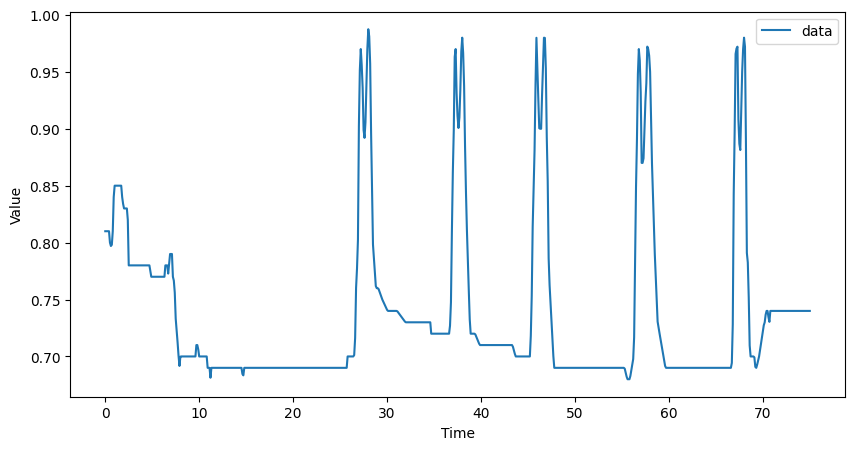

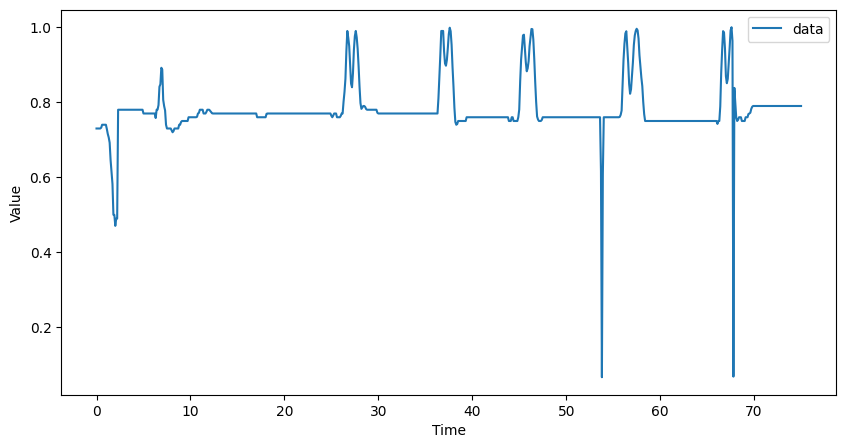

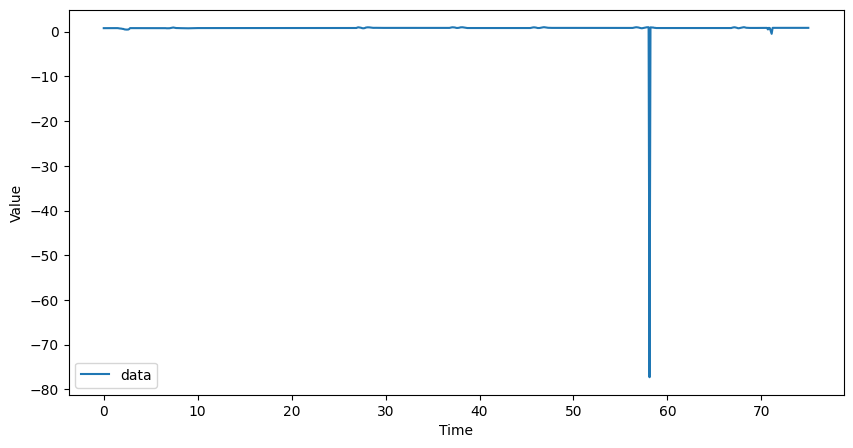

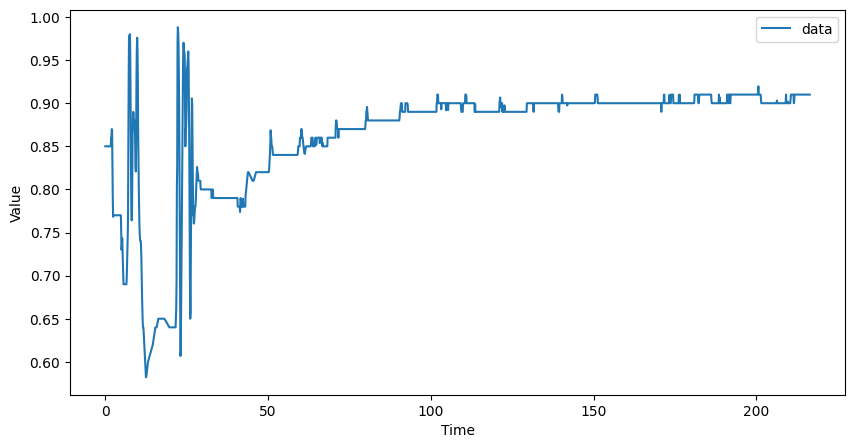

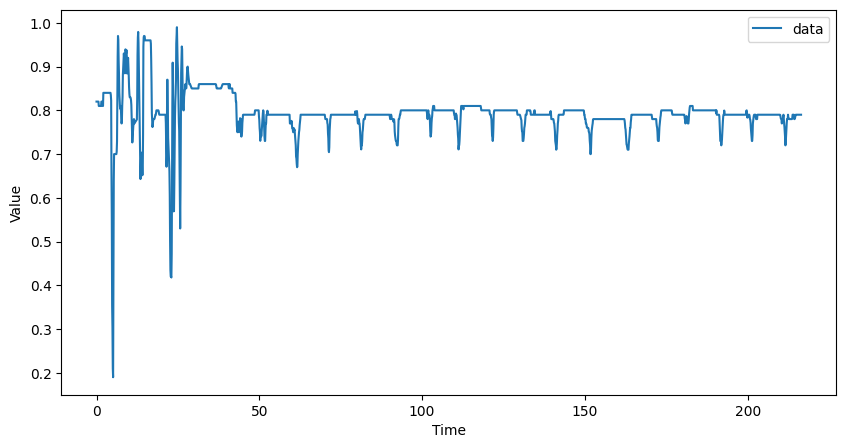

...

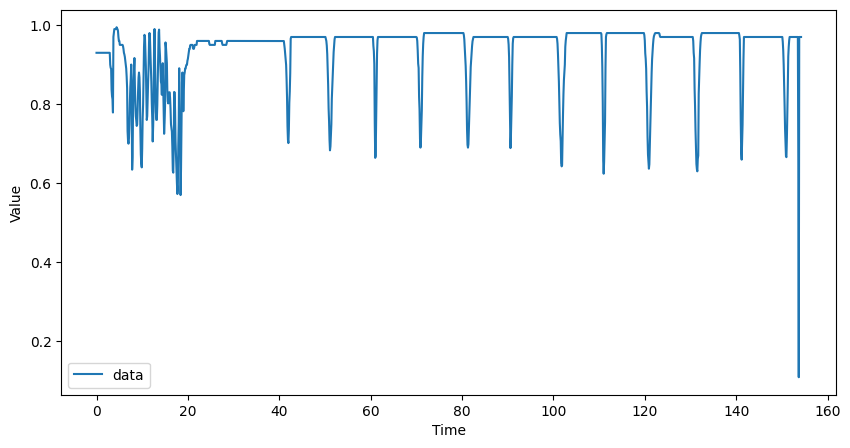

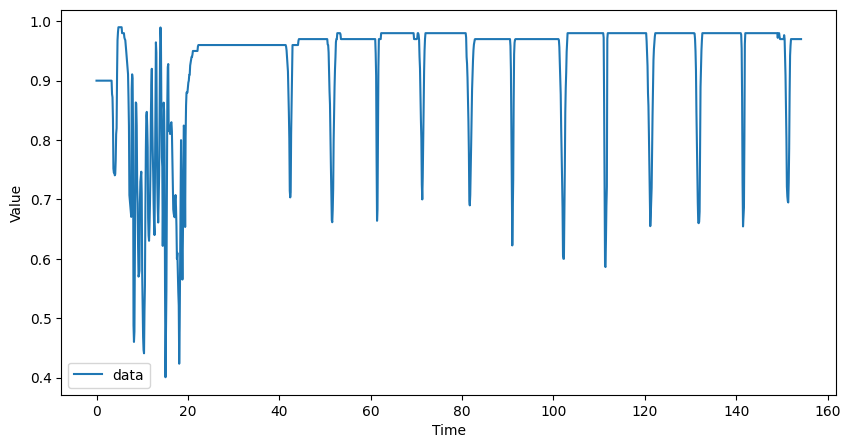

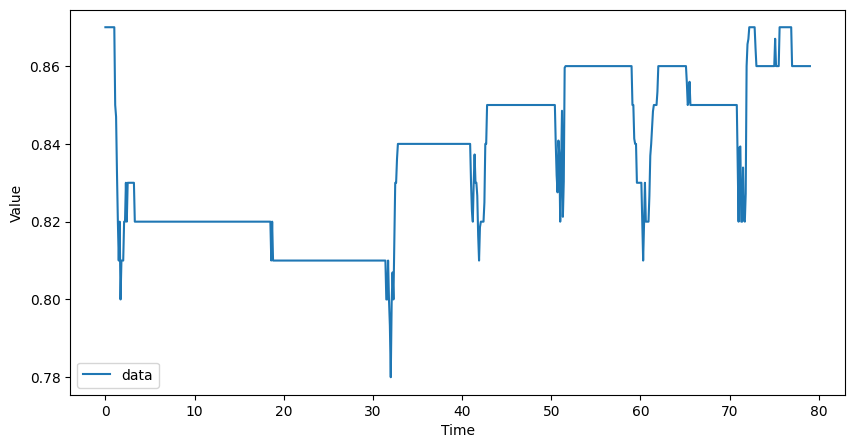

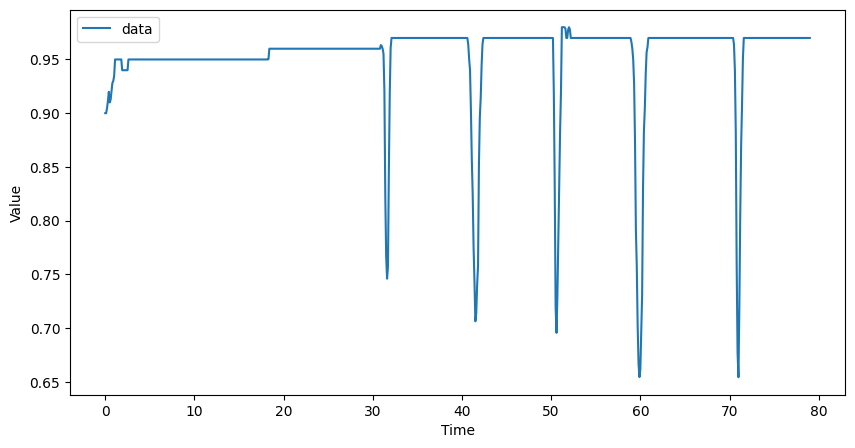

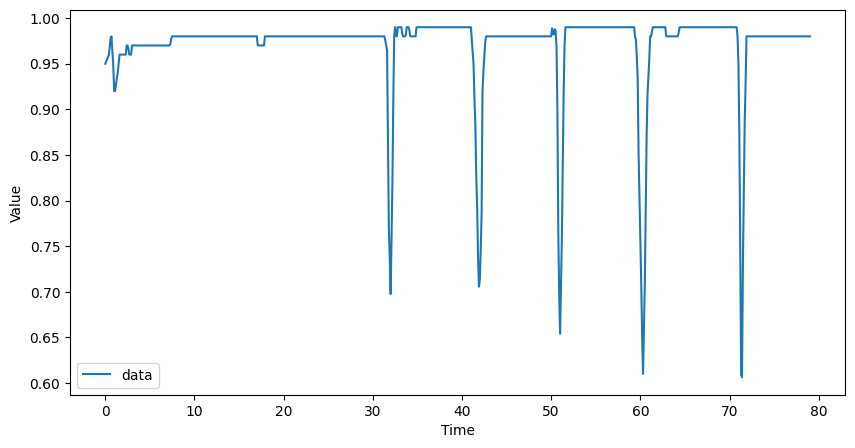

In [ ]:
import os
import pandas as pd

# Directory containing class folders
base_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups"

# Iterate through class folders
for class_name in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        csv_files = [f for f in os.listdir(class_dir) if f.endswith(".csv")]

        if len(csv_files) > 1:
            # Find minimum number of rows among CSV files
            min_rows = float('inf')
            for csv_file in csv_files:
                df = pd.read_csv(os.path.join(class_dir, csv_file))
                min_rows = min(min_rows, len(df))

            # Trim excess rows in each CSV file
            for csv_file in csv_files:
                csv_path = os.path.join(class_dir, csv_file)
                df = pd.read_csv(csv_path)
                df = df.iloc[:min_rows, :]
                df.to_csv(csv_path, index=False)

                print(f"Trimmed rows in {csv_file} to {min_rows}")
                plot_data(df.iloc[:, 0], df.iloc[:, 6])
        else:
            print(f"Skipping {class_name} class (only one CSV file)")

print("Row trimming process completed.")


In [ ]:
import os
import shutil

# Directory containing class folders
base_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups"

# General folder where all files will be moved
general_folder = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Lengths adjusted"

# Iterate through class folders
for class_name in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        csv_files = [f for f in os.listdir(class_dir) if f.endswith(".csv")]

        for csv_file in csv_files:
            source_path = os.path.join(class_dir, csv_file)
            destination_path = os.path.join(general_folder, csv_file)

            # Move the file to the general folder
            shutil.move(source_path, destination_path)

            print(f"Moved {csv_file} to general folder")

        # Remove the now-empty class folder
        os.rmdir(class_dir)

print("Moving process completed.")


Moved IMU_Data_ID63_ShoulderEF1.csv to general folder
Moved IMU_Data_ID62_ShoulderEF1.csv to general folder
Moved IMU_Data_ID61_ShoulderEF1.csv to general folder
Moved IMU_Data_ID63_Wrist.csv to general folder
Moved IMU_Data_ID62_Wrist.csv to general folder
Moved IMU_Data_ID61_Wrist.csv to general folder
Moved IMU_Data_ID63_ShoulderLat.csv to general folder
Moved IMU_Data_ID62_ShoulderLat.csv to general folder
Moved IMU_Data_ID61_ShoulderLat.csv to general folder
Moved IMU_Data_ID63_ShoulderLat1.csv to general folder
Moved IMU_Data_ID62_ShoulderLat1.csv to general folder
Moved IMU_Data_ID61_ShoulderLat1.csv to general folder
Moved IMU_Data_ID63_ShoulderHor1.csv to general folder
Moved IMU_Data_ID62_ShoulderHor1.csv to general folder
Moved IMU_Data_ID61_ShoulderHor1.csv to general folder
Moved IMU_Data_ID63_ShoulderHor.csv to general folder
Moved IMU_Data_ID62_ShoulderHor.csv to general folder
Moved IMU_Data_ID61_ShoulderHor.csv to general folder
Moved IMU_Data_ID63_ShoulderCircle.csv t

In [ ]:
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

for csv_file in csv_files:
  df = pd.read_csv(os.path.join(folder_path, csv_file))
  print(f"File: {csv_file}, Length: {len(df)}")

Cut off the first 30 seconds

<ipython-input-4-ca597353d343>:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))


First 300 rows removed from each CSV file.


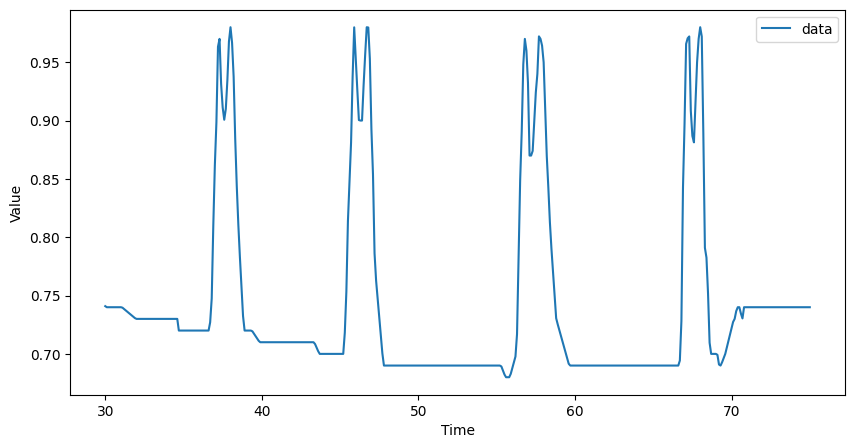

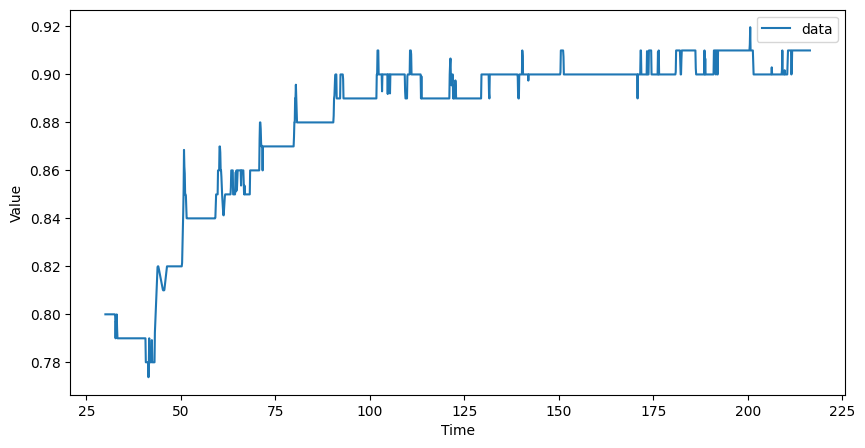

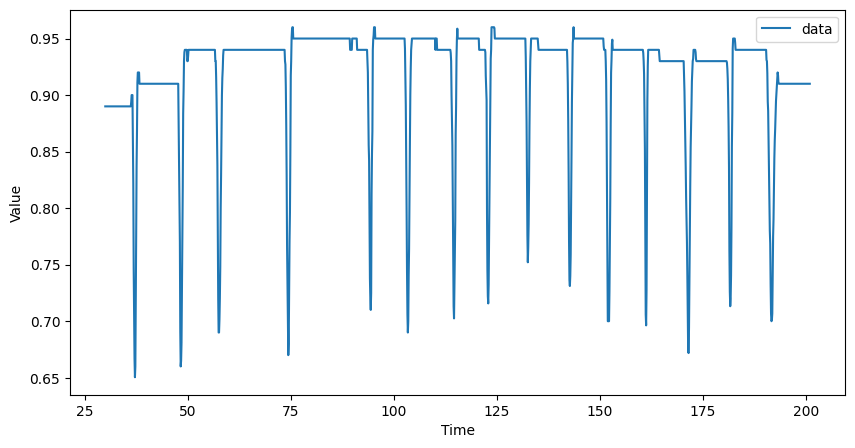

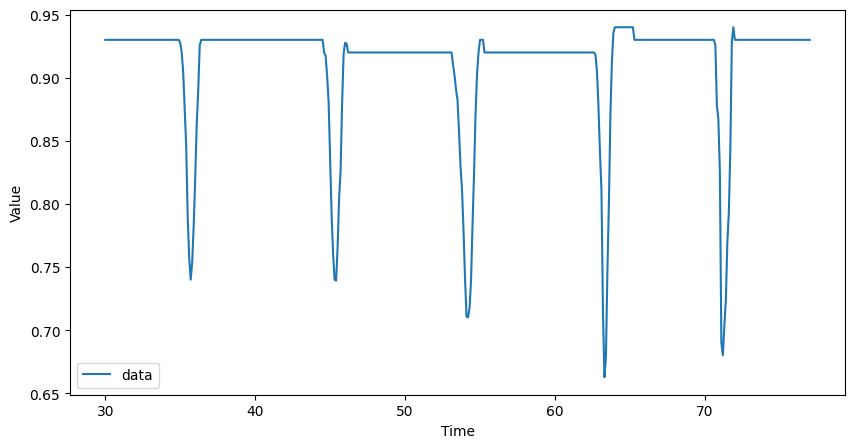

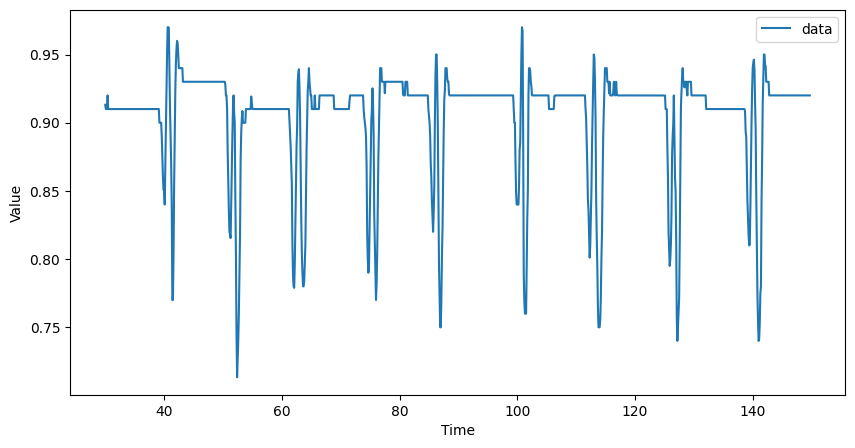

...

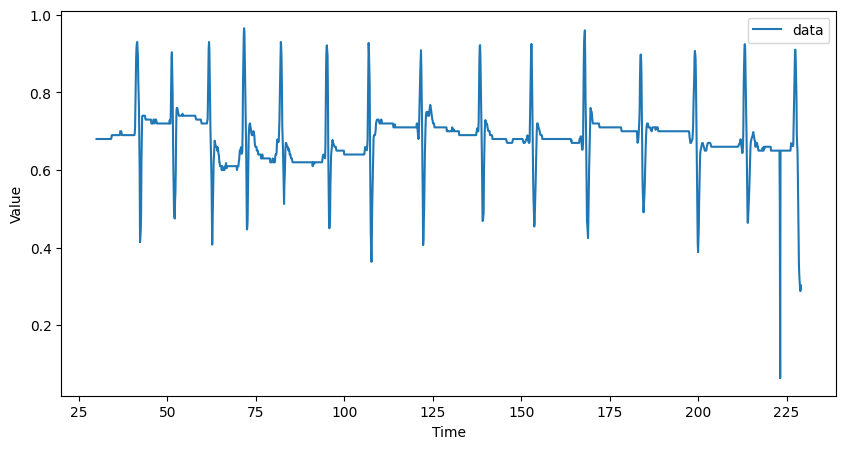

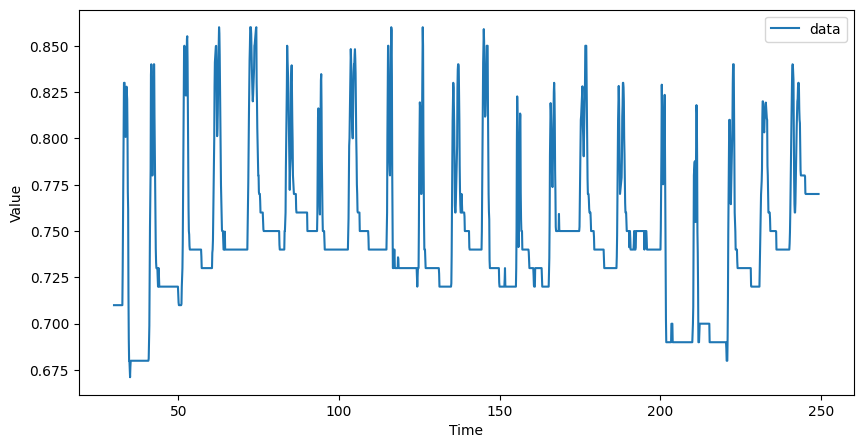

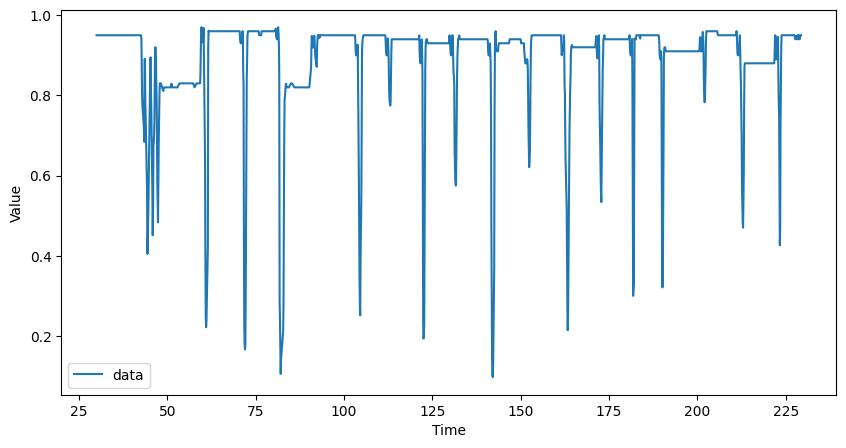

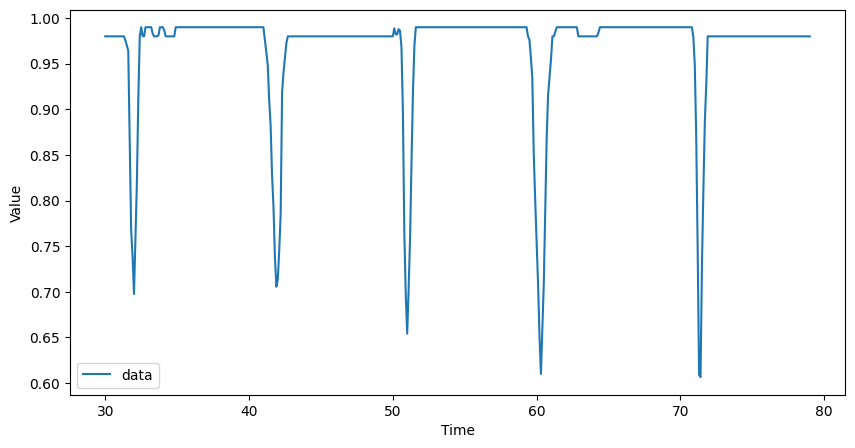

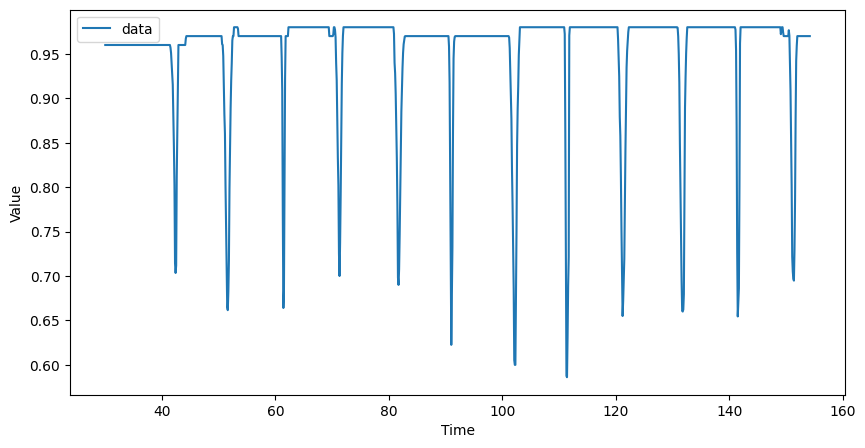

In [ ]:
import os
import pandas as pd

# Specify the folder path containing the CSV files
folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Lengths adjusted'

# Get a list of all the CSV files in the folder
csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

# Process each CSV file
for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)

    # Remove the first 30 rows
    df = df.iloc[300:]

    # Save the modified DataFrame back to the CSV file
    df.to_csv(file_path, index=False)

    plot_data(df.iloc[:, 0], df.iloc[:, 6])

print("First 300 rows removed from each CSV file.")



In [ ]:
import os
import shutil

# General folder where all files are located
general_folder = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Lengths adjusted"

# Directory where class folders will be recreated
base_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups"

# Iterate through files in the general folder
for filename in os.listdir(general_folder):
    if filename.endswith(".csv"):
        # Extract class name from filename
        class_name = filename.split("_")[-1].replace(".csv", "")

        # Create class directory if it doesn't exist
        class_dir = os.path.join(base_dir, class_name)
        if not os.path.exists(class_dir):
            os.makedirs(class_dir)

        # Move the file back to the class folder
        source_path = os.path.join(general_folder, filename)
        destination_path = os.path.join(class_dir, filename)
        shutil.move(source_path, destination_path)

        print(f"Moved {filename} back to {class_name} folder")

print("Moving back process completed.")


Moved IMU_Data_ID63_ShoulderEF1.csv back to ShoulderEF1 folder
Moved IMU_Data_ID63_Wrist.csv back to Wrist folder
Moved IMU_Data_ID63_ShoulderLat.csv back to ShoulderLat folder
Moved IMU_Data_ID63_ShoulderLat1.csv back to ShoulderLat1 folder
Moved IMU_Data_ID63_ShoulderHor1.csv back to ShoulderHor1 folder
Moved IMU_Data_ID63_ShoulderHor.csv back to ShoulderHor folder
Moved IMU_Data_ID63_ShoulderCircle.csv back to ShoulderCircle folder
Moved IMU_Data_ID63_ShoulderEF.csv back to ShoulderEF folder
Moved IMU_Data_ID63_ShoulderAB.csv back to ShoulderAB folder
Moved IMU_Data_ID63_Forearm.csv back to Forearm folder
Moved IMU_Data_ID63_elbow.csv back to elbow folder
Moved IMU_Data_ID62_ShoulderLat1.csv back to ShoulderLat1 folder
Moved IMU_Data_ID62_Wrist.csv back to Wrist folder
Moved IMU_Data_ID63_elbow1.csv back to elbow1 folder
Moved IMU_Data_ID62_ShoulderLat.csv back to ShoulderLat folder
Moved IMU_Data_ID62_ShoulderHor1.csv back to ShoulderHor1 folder
Moved IMU_Data_ID62_ShoulderHor.csv 

# Filtering Functions

In [ ]:
def filter_and_seg(data_type, euler_data, time_data):
    #get euler data
    #Z_old = [data[data_type] for data in euler_data]
    Z_old = euler_data

    #run kalman filter on high and low sensitivity
    Z_accurate = run_kalman(Z_old, 0.15/60, 10, 50) #Low sensitivity (similar to original values)
    predictions = run_kalman(Z_old, 0.15/60, 0.01, 2) #High sensitivity (filtered more)
    if data_type < 3:
        # low-pass filter data for euler data
        predictions = butter_lowpass_filter(Z_old, 20, 100.0, 1) #cutoff = 20, sampling freq = 100, order = 2
    else:
        predictions = peak_preservation(Z_old, predictions, Z_accurate, 2, 4) #Z_old, high sensitivity, low sensitivity, window, data type
    #convert signals to numpy arrays
    if type(predictions) != np.ndarray:
        predictions = np.squeeze(predictions)
        predictions = np.asarray(predictions)
    if type(Z_old) != np.ndarray:
        Z_old = np.asarray(Z_old)

    #predictions = Z_old

    #data segmentatation
    if data_type > 2:
        result = get_spikes(time_data, predictions, 2, 0.95, 10, 60)
    else:
        result = get_spikes(time_data, predictions, 1.8, 0.95, 0.01, 0.05)


    print("result: ", result)

    # display individual graphs
    #rpt.display(predictions, Z_old, bkps, result)
    #plt.show()

    return time_data, predictions, result

result:  [   0    3  126  191  293  319  405  429  506  559  602  633  731  755
  817  836  912  937  997 1028 1106 1138 1209 1232 1314 1346 1411 1438
 1506 1527 1590 1610 1705 1726 1809 1835 1917 1939]
result:  [ 126  201  293  324  404  430  505  538  595  642  731  758  810  846
  912  936  994 1033 1105 1137 1208 1244 1311 1354 1394 1446 1506 1546
 1590 1618 1705 1737 1809 1843 1917 1946]
result:  [   0    6  126  191  293  336  404  446  505  544  602  650  731  757
  810  857  912  936  995 1030 1104 1150 1199 1247 1311 1356 1410 1447
 1506 1546 1590 1613 1705 1736 1809 1840 1917 1961]
<class 'pandas.core.series.Series'>
result:  [ 127  204  293  324  405  429  506  535  603  628  732  749  815  834
  913  934  997 1023 1105 1138 1209 1239 1311 1345 1411 1438 1507 1532
 1591 1617 1706 1728 1810 1834 1917 1938]
<class 'pandas.core.series.Series'>
result:  [ 127  188  294  338  403  436  506  540  603  641  729  766  814  843
  851  857  912  936  996 1029 1105 1149 1200 1239 1309 

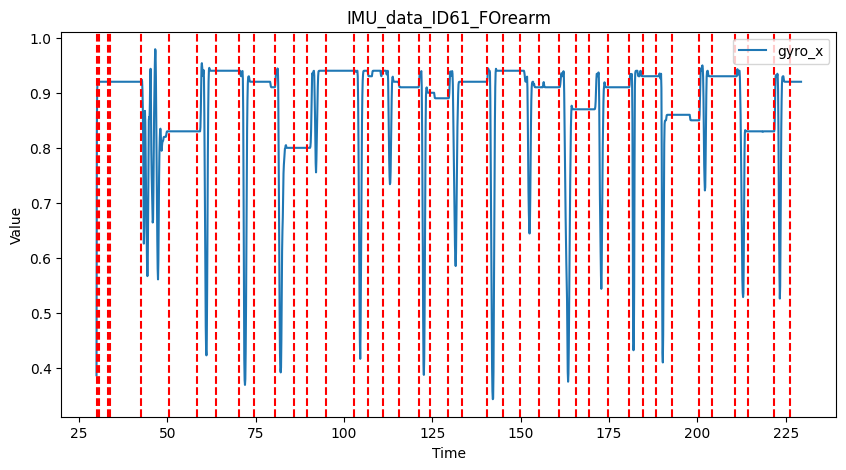

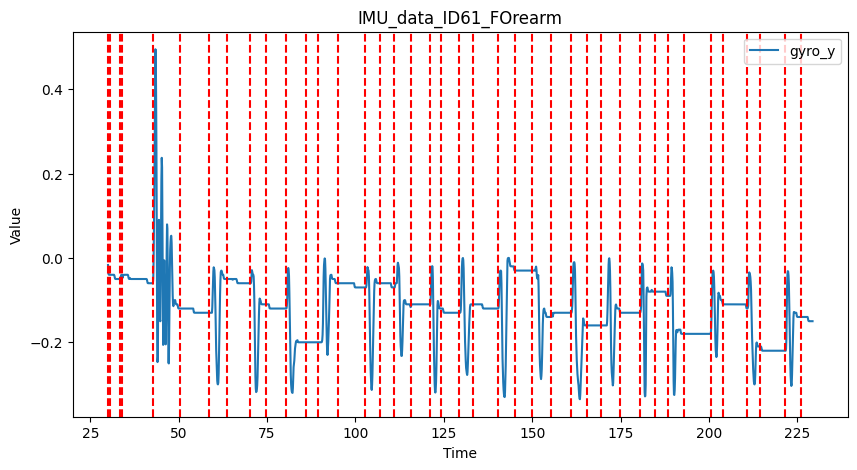

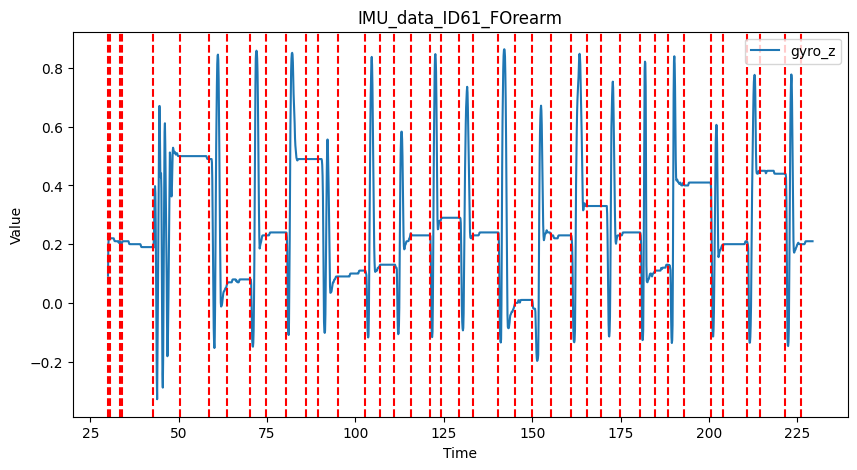

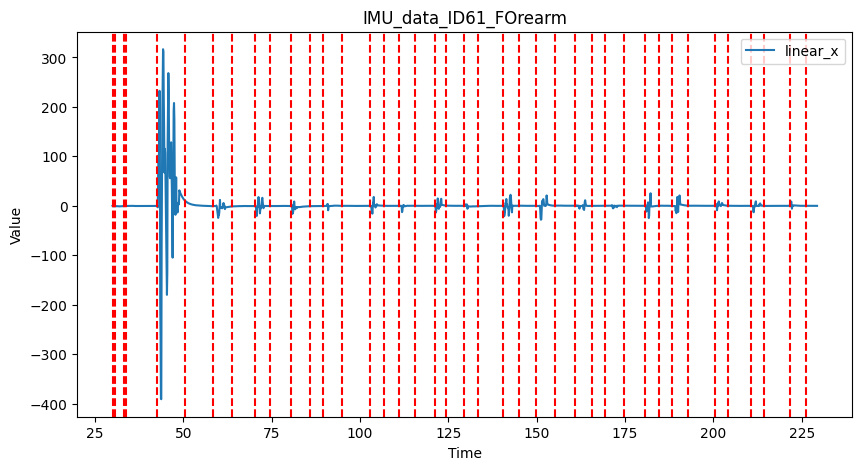

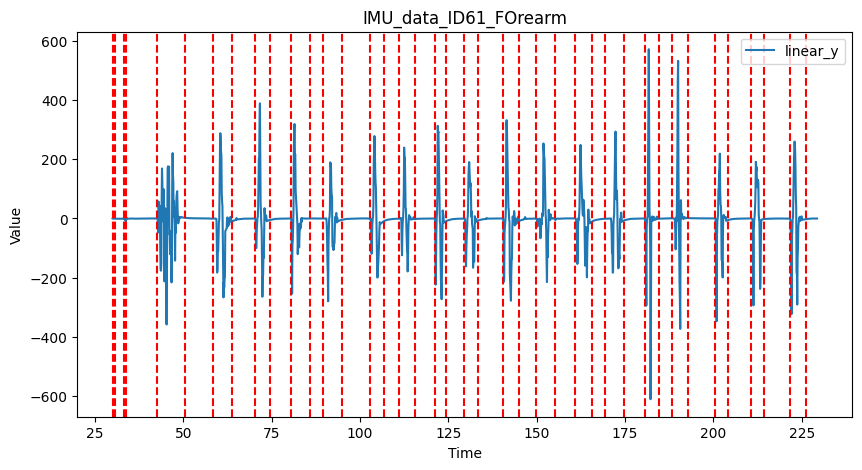

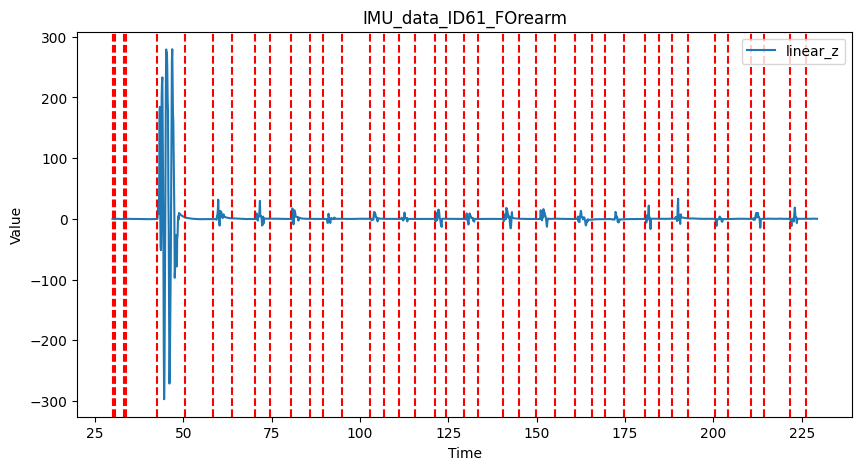

In [ ]:
# Specify the path to the CSV file
csv_file_path_1 = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups/Forearm/IMU_Data_ID61_Forearm.csv'
csv_file_path_2 = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups/Forearm/IMU_Data_ID62_Forearm.csv'
csv_file_path_3 = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups/Forearm/IMU_Data_ID63_Forearm.csv'
# Read the CSV file into a pandas DataFrame
df1 = pd.read_csv(csv_file_path_1)
df2 = pd.read_csv(csv_file_path_2)
df3 = pd.read_csv(csv_file_path_3)

time_data = df1.iloc[:, 6].values

results = []
data_types = ['gyro_x', 'gyro_y', 'gyro_z', 'linear_x', 'linear_y', 'linear_z']
filtered_df1 = pd.DataFrame()
filtered_df2 = pd.DataFrame()
filtered_df3 = pd.DataFrame()

results = []

# SENSOR 1
for i in range(6):
  time, predictions, segments_temp = filter_and_seg(i, df1.iloc[:, i], time_data)
  results.append(segments_temp)

  # Append the filtered column to the DataFrame
  filtered_df1[data_types[i]] = predictions

filtered_df1['Time'] = time_data

overall_segments_1 = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

results = []

#SENSOR 2
for i in range(6):
  time, predictions, segments_temp = filter_and_seg(i, df2.iloc[:, i], time_data)
  results.append(segments_temp)

  # Append the filtered column to the DataFrame
  filtered_df2[data_types[i]] = predictions

filtered_df2['Time'] = time_data

overall_segments_2 = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

results = []

#SENSOR 3
for i in range(6):
  time, predictions, segments_temp = filter_and_seg(i, df3.iloc[:, i], time_data)
  results.append(segments_temp)

  # Append the filtered column to the DataFrame
  filtered_df3[data_types[i]] = predictions

filtered_df3['Time'] = time_data

overall_segments_3 = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

overall_segments = combine_segments_three(overall_segments_1, overall_segments_2, overall_segments_3)

for i in range(6):
  plot_data_with_segments(filtered_df2.iloc[:, i], overall_segments, filtered_df2.iloc[:, 6], data_types[i], 'IMU_data_ID61_FOrearm')

#output_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Classified Data (3 Sensors)/1 sensor filtered'

for i in range(0, len(overall_segments_1), 2):
        start_idx = overall_segments_1[i]
        end_idx = overall_segments_1[i + 1]
        segment_df = filtered_df1.iloc[start_idx:end_idx + 1, :].reset_index(drop=True)
        #segment_file_path = os.path.join(output_folder, f"{'IMU_data_ID61_Elbow.csv'}_segment_{i//2+1}.csv")
        #segment_df.to_csv(segment_file_path, index=False)

result:  [  0   3  66  98 152 179 253 297 366 408]
result:  [  0  18  66 105 149 194 259 295 366 406]
result:  [  0  18  68  98 146 189 258 297 365 404]
<class 'pandas.core.series.Series'>
result:  [ 65 103 152 186 259 304 366 403]
<class 'pandas.core.series.Series'>
result:  [ 63 107 150 182 257 289 364 401]
<class 'pandas.core.series.Series'>
result:  [ 67  91 150 179 259 293 366 402]
[(0, 3), (0, 18), (0, 18), (63, 107), (65, 103), (66, 98), (66, 105), (67, 91), (68, 98), (146, 189), (149, 194), (150, 179), (150, 182), (152, 179), (152, 186), (253, 297), (257, 289), (258, 297), (259, 293), (259, 295), (259, 304), (364, 401), (365, 404), (366, 402), (366, 403), (366, 406), (366, 408)]
result:  [  0   3  63  85 138 175 236 242 257 285 360 399]
result:  [  0   3  62  93 139 174 236 244 257 285 363 399]
result:  [  0   4  62  92 147 175 236 241 256 295 364 399]
<class 'pandas.core.series.Series'>
result:  [ 62  94 139 178 257 297 362 399]
<class 'pandas.core.series.Series'>
result:  [ 6

<ipython-input-12-ca597353d343>:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))


result:  [   0    3  206  235  305  341  408  446  507  530  548  552  654  687
  786  817  884  920 1007 1041 1108 1114]
result:  [   0    3  206  234  305  344  407  442  507  530  648  679  787  818
  886  922 1008 1030 1108 1114]
result:  [   0    3  206  235  305  357  407  448  507  531  655  690  786  829
  886  922 1008 1033 1107 1114]
<class 'pandas.core.series.Series'>
result:  [ 207  242  305  350  408  449  508  529  655  686  787  827  885  924
 1007 1038 1108 1114]
<class 'pandas.core.series.Series'>
result:  [ 134  143  206  239  297  359  405  439  508  558  653  701  785  833
  884  926 1007 1043]
<class 'pandas.core.series.Series'>
result:  [ 150  152  206  238  304  355  408  443  506  528  654  680  786  816
  885  916 1007 1028 1108 1114]
[(0, 3), (0, 3), (0, 3), (134, 143), (150, 152), (206, 234), (206, 235), (206, 235), (206, 238), (206, 239), (207, 242), (297, 359), (304, 355), (305, 341), (305, 344), (305, 350), (305, 357), (405, 439), (407, 442), (407, 448), (

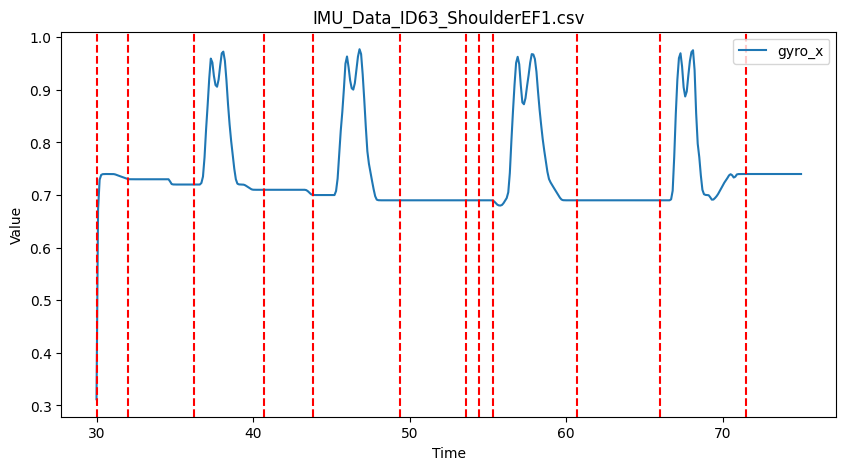

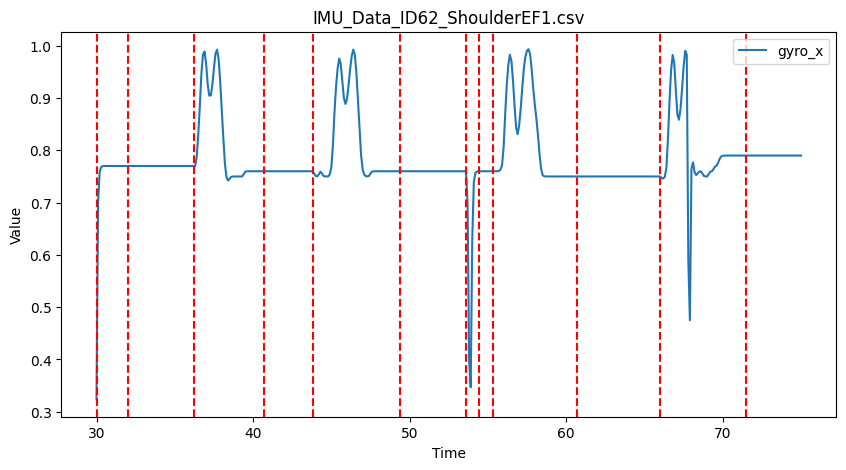

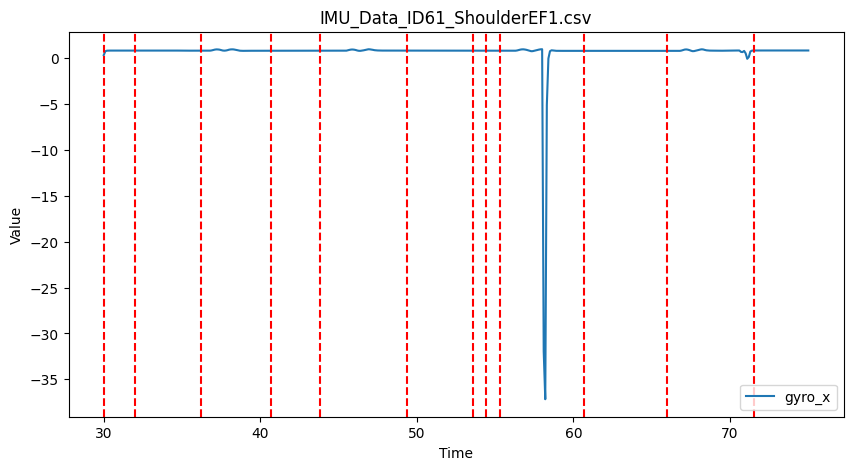

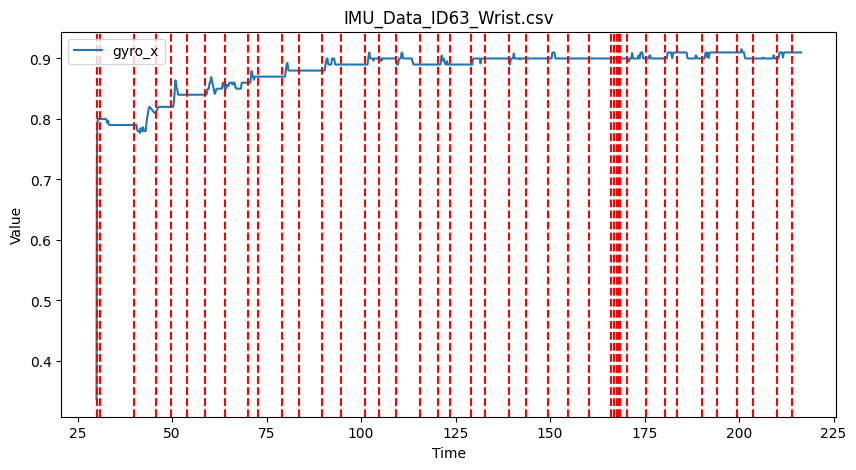

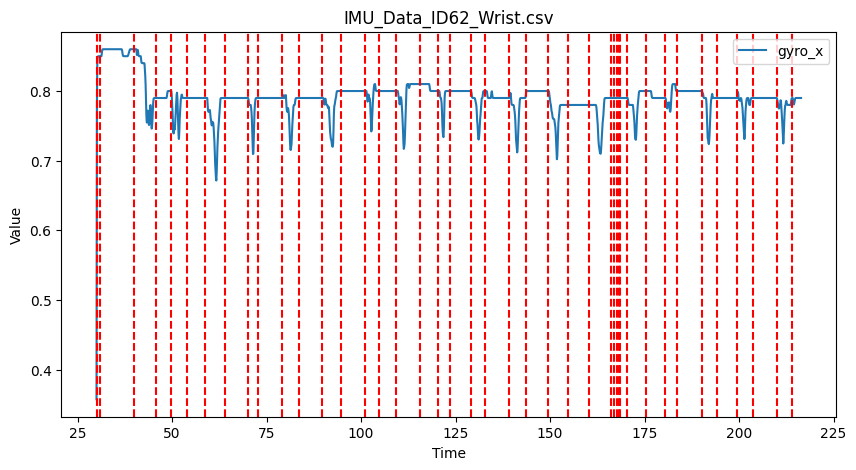

...

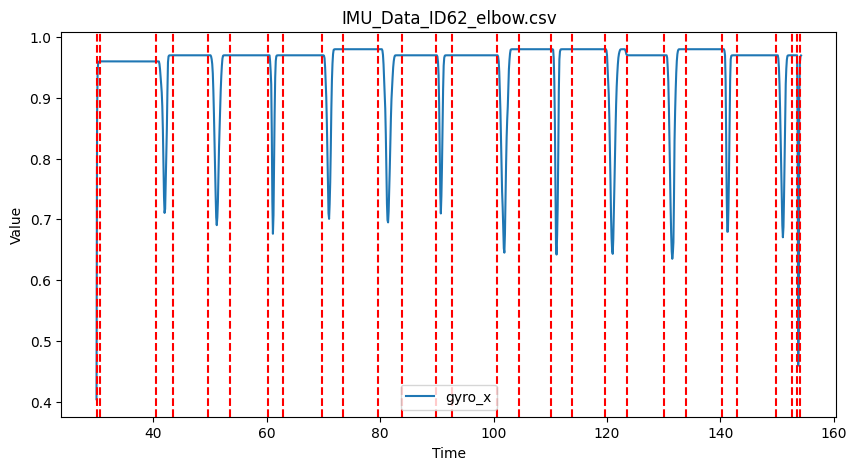

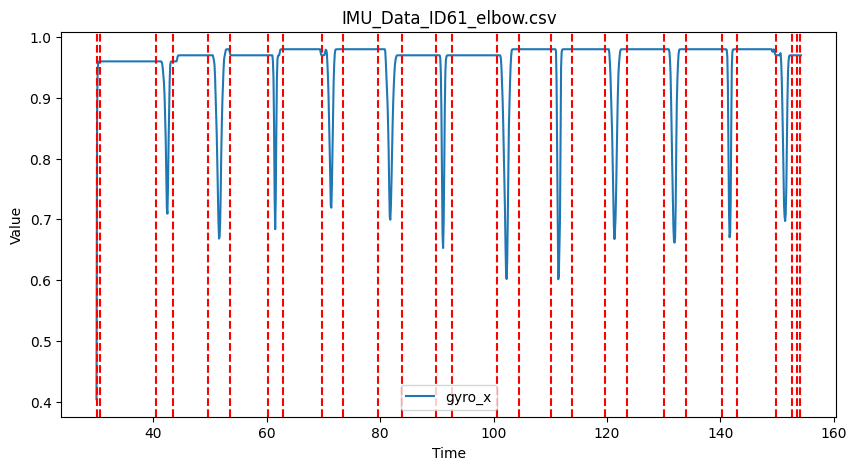

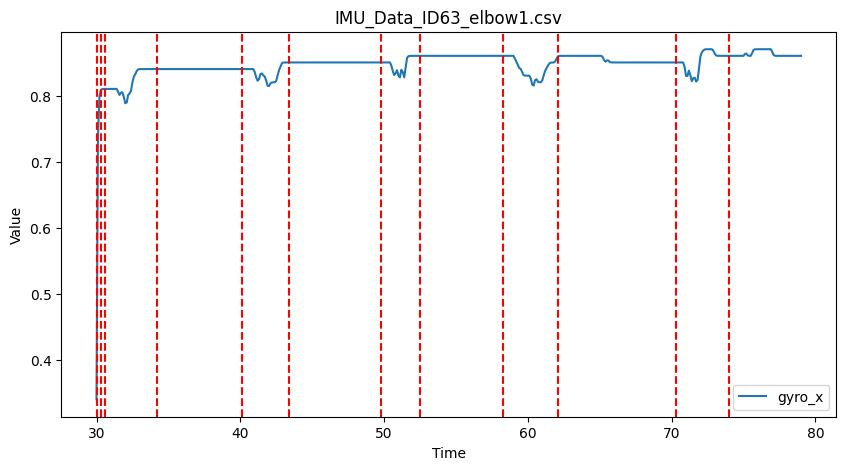

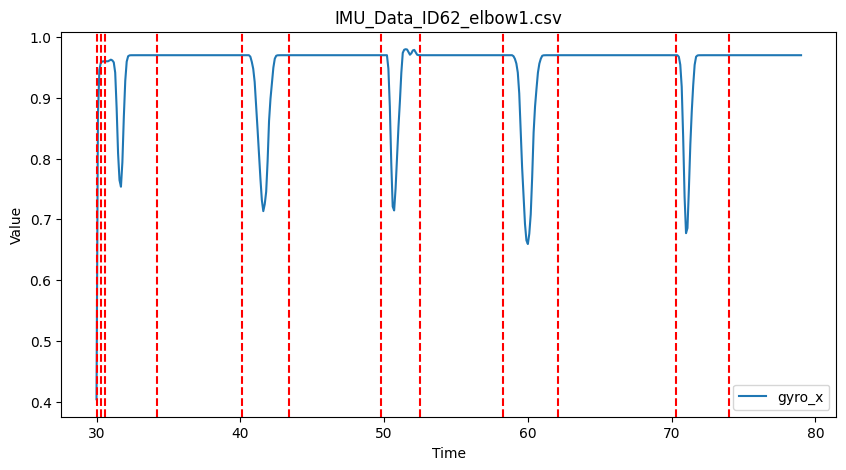

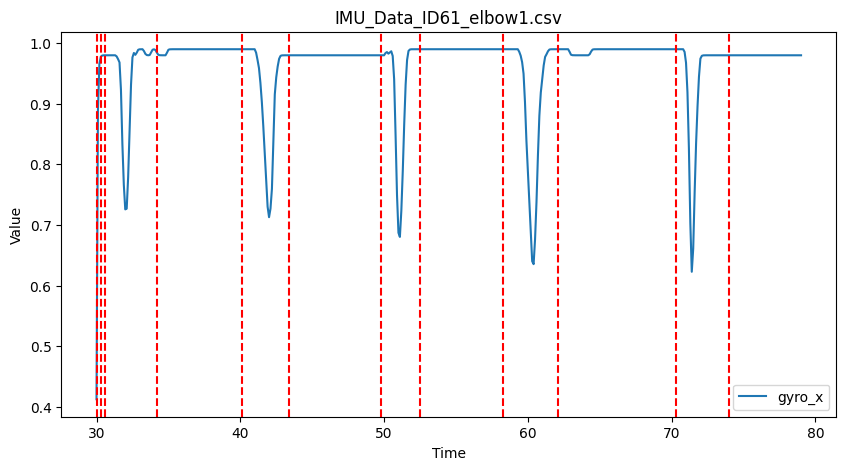

In [ ]:
import os

# Directory containing class folders
base_dir = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Groups"
output_dir = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Segments'
# Iterate through class folders
for class_name in os.listdir(base_dir):
    class_dir = os.path.join(base_dir, class_name)
    if os.path.isdir(class_dir):
        #collect info for each file in folder and append here
        filtered_data = []
        overall_segments_mid = []
        names = []

        # Iterate through files in the class folder
        for filename in os.listdir(class_dir):
            names.append(filename)
            if filename.endswith(".csv"):
                file_path = os.path.join(class_dir, filename)
                df = pd.read_csv(file_path)
                results = []
                filtered_df = pd.DataFrame()
                time_data = df.iloc[:, 6]

                for i in range(6):
                  time, predictions, segments_temp = filter_and_seg(i, df.iloc[:, i], time_data)
                  results.append(segments_temp)
                  filtered_df[data_types[i]] = predictions

                filtered_df['Time'] = time
                filtered_data.append(filtered_df)
                overall_segments_mid.append(combine_segments(results[0], results[1], results[2], results[3], results[4], results[5]))

    overall_segments = combine_segments_three(overall_segments_mid[0], overall_segments_mid[1], overall_segments_mid[2])

    # Extract the first 6 columns from each dataframe and create a new dataframe
    new_columns = []
    for df in filtered_data:
        new_columns.append(df.iloc[:, :6])

    # Concatenate the new_columns list of dataframes horizontally
    result = pd.concat(new_columns, axis=1)

    # Add the last column of the first dataframe as the last column of the result
    result = pd.concat([result, filtered_data[0].iloc[:, -1]], axis=1)

    #Plot some sensor data with overall segments
    for i in range(3):
       plot_data_with_segments(result.iloc[:, 6*i], overall_segments, result.iloc[:, 18], data_types[0], names[i])

    # Save each segment as a separate CSV file
    for i in range(0, len(overall_segments), 2):
        start_idx = overall_segments[i]
        end_idx = overall_segments[i + 1]
        segment_df = result.iloc[start_idx:end_idx + 1, :].reset_index(drop=True)
        segment_file_path = os.path.join(output_dir, f"{filename}_segment_{i//2+1}.csv")
        segment_df.to_csv(segment_file_path, index=False)

print("Processing completed.")


NAME:  IMU_data_ID61_Elbow.csv
result:  [   0    3   17   50   66  118  127  175  197  237  241  281  324  376
  383  418  445  486  504  554  575  607  646  689  722  747  761  779
  792  877  937  972 1027 1089]
result:  [   0  162  200  237  247  289  332  374  383  414  447  474  504  551
  576  610  646  713  722  747  790  884  937  982 1024 1089]
result:  [   0    2   17   45   56  107  129  167  196  279  333  362  382  410
  445  479  504  547  575  614  646  685  722  747  758  774  790  870
  936  984 1027 1089]
<class 'pandas.core.series.Series'>
result:  [  17   44   79  103  128  162  198  295  334  361  382  410  445  477
  576  618  644  699  720  776  792  834  937  967 1025 1088]
<class 'pandas.core.series.Series'>
result:  [  14   47   71  106  128  167  197  291  333  415  434  488  575  611
  645  679  719  753  791  848  850  871  935  979 1026 1088]
<class 'pandas.core.series.Series'>
result:  [  15  121  127  160  196  229  242  287  325  365  384  412  444  485

<ipython-input-39-1c474555d9ba>:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, (ax1) = plt.subplots(1, 1, figsize=(10, 5))


NAME:  IMU_data_ID61_Elbow(1).csv
result:  [   0    3   99  116  191  208  296  329  396  413  498  530  595  614
  706  723  792  828  902  917  993 1017 1106 1124 1200 1217 1301 1324
 1394 1422 1501 1517 1602 1615 1700 1733 1797 1817 1903 1937 2003 2037]
result:  [  98  118  189  212  291  335  395  417  495  536  593  620  706  725
  791  830  902  919  992 1019 1105 1127 1195 1231 1294 1328 1393 1433
 1500 1534 1601 1615 1698 1733 1795 1826 1902 1934 2001 2038]
result:  [   0    2   99  117  189  206  296  329  396  413  511  530  587  614
  706  722  792  829  902  917 1105 1130 1197 1218 1300 1325 1394 1426
 1500 1526 1600 1616 1696 1742 1794 1829 1902 1934]
<class 'pandas.core.series.Series'>
result:  [  98  117  188  210  294  334  394  420  495  535  593  620  706  730
  791  837  901  917  992 1021 1104 1128 1197 1227 1300 1328 1392 1428
 1499 1526 1601 1618 1698 1737 1794 1825 1901 1937 2000 2041]
<class 'pandas.core.series.Series'>
result:  [  99  115  189  208  396  417  5

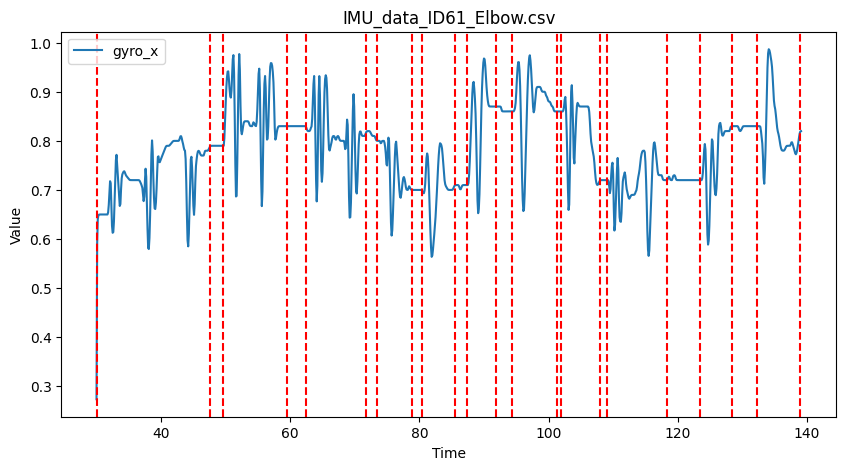

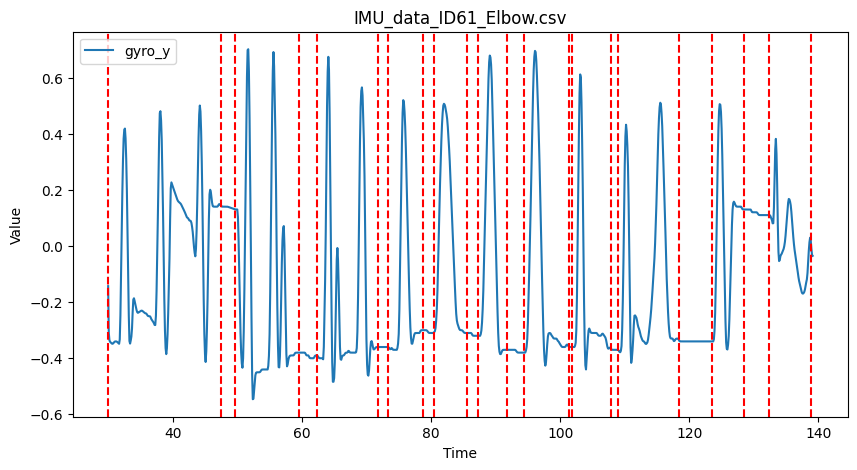

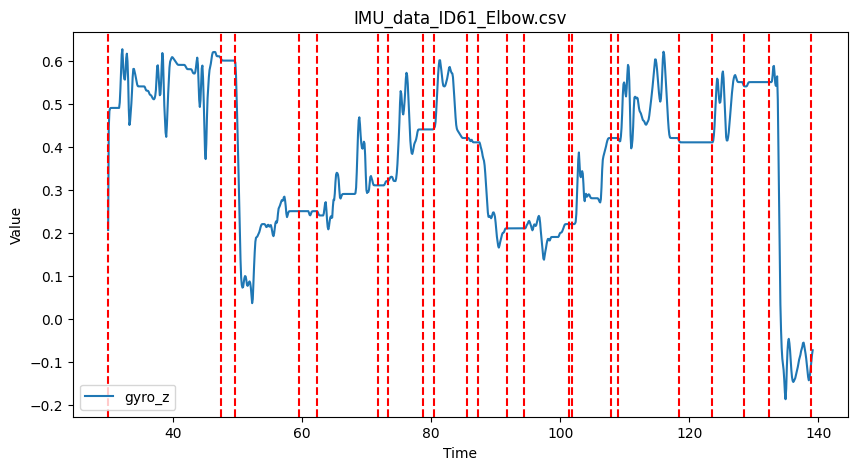

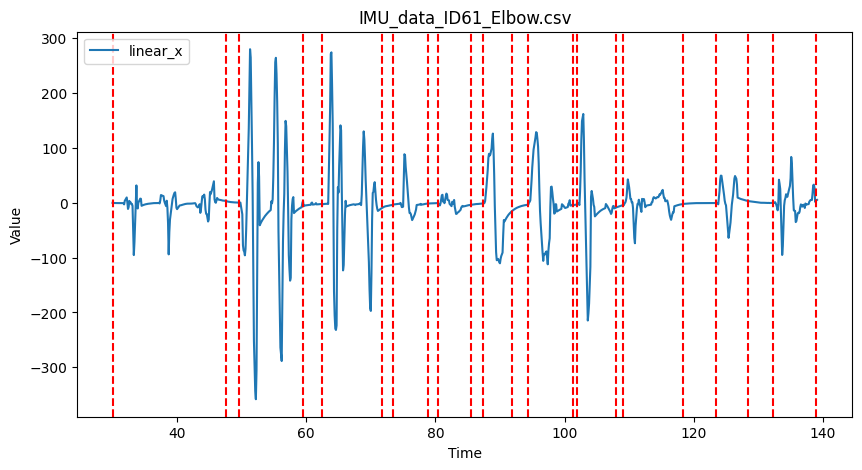

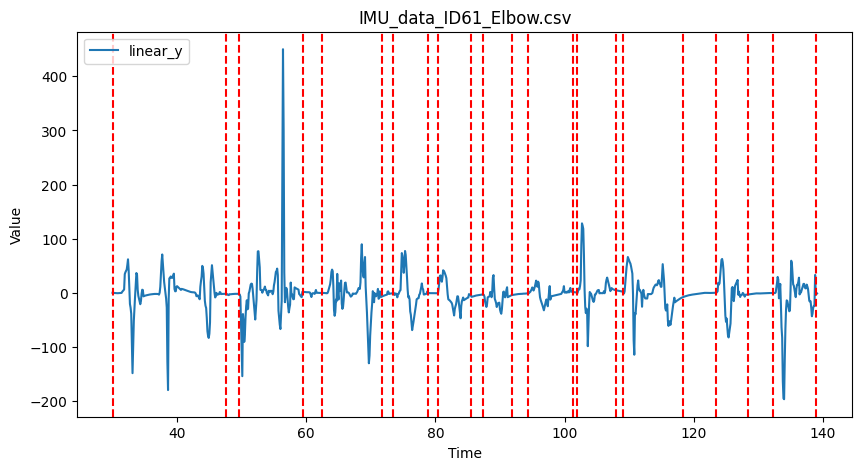

...

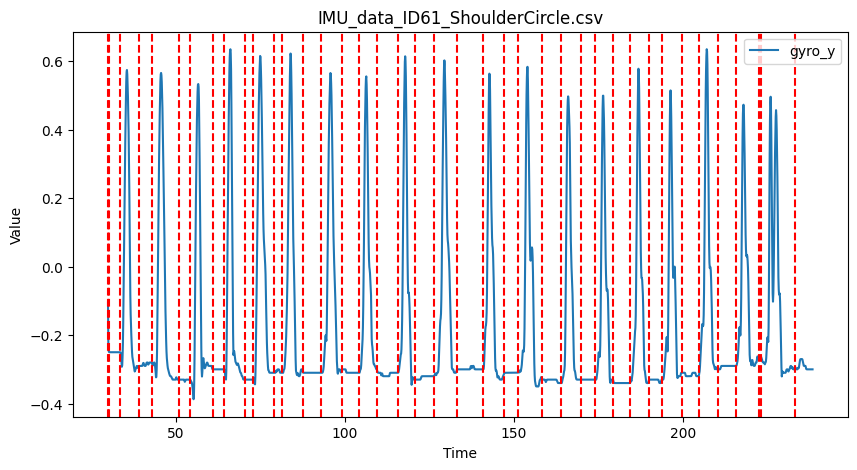

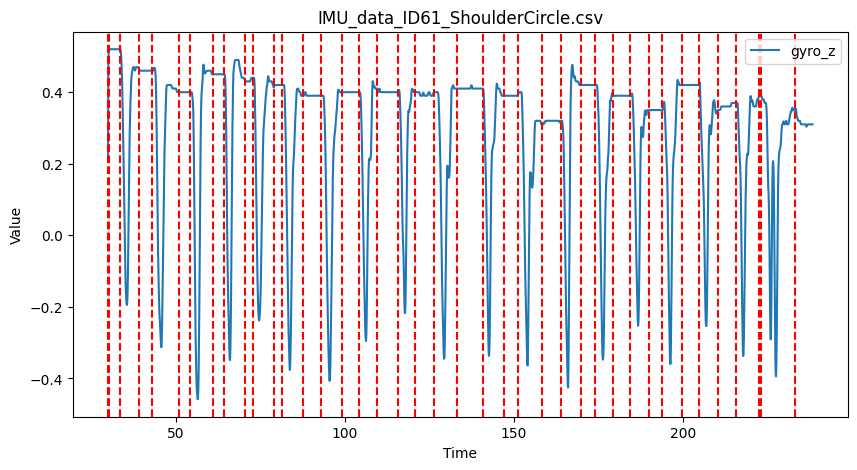

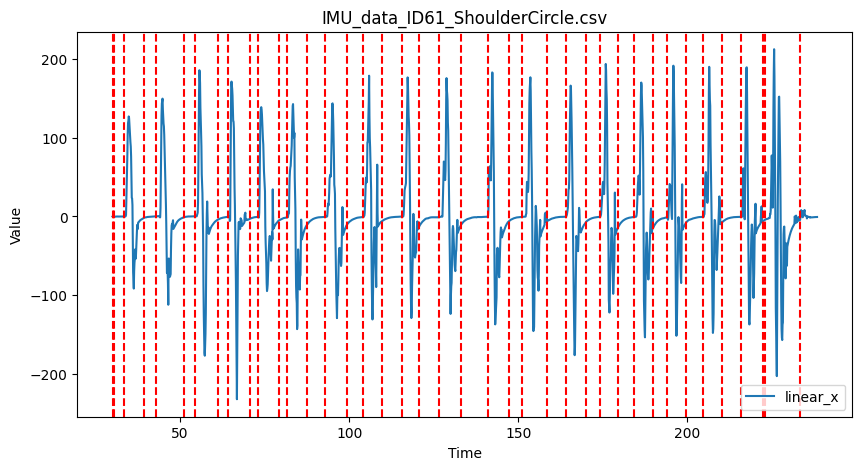

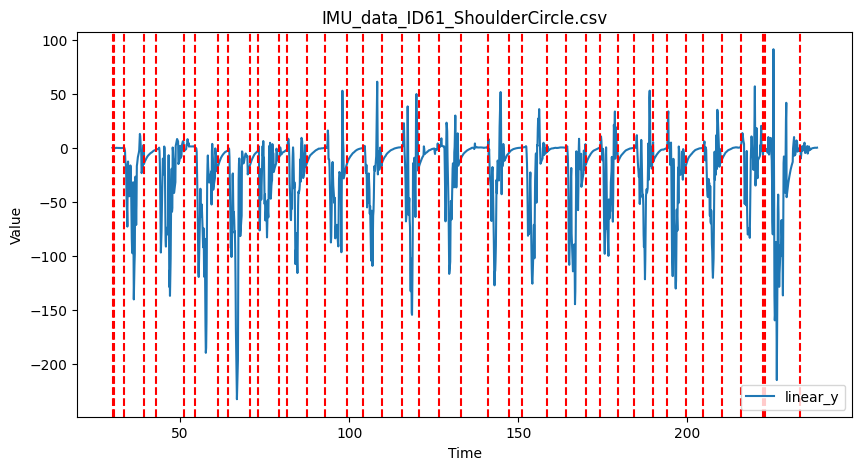

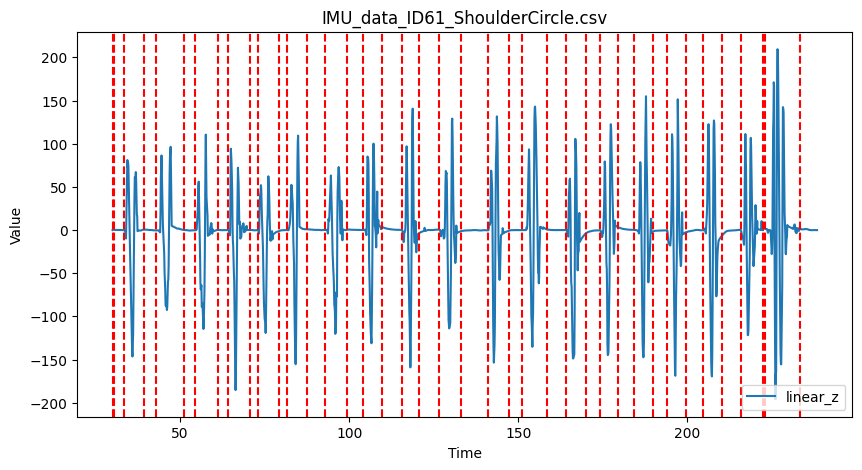

In [ ]:
import os
import shutil

folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Classified Data (3 Sensors)/Interpolated Data/sensor 61'

csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

data_types = ['gyro_x', 'gyro_y', 'gyro_z', 'linear_x', 'linear_y', 'linear_z']

# Define the output folder for filtered CSV files
output_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Classified Data (3 Sensors)/1 sensor filtered'

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Process each CSV file
for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)

    print("NAME: ", csv_file)

    time_data = df.iloc[:, 6]

    # Initialize a DataFrame to store the filtered columns
    filtered_df = pd.DataFrame()

    results = []

    # Filter and segment each data type for each file
    for i in range(6):
        time, predictions, segments_temp = filter_and_seg(i, df.iloc[:, i], time_data)
        results.append(segments_temp)

        # Append the filtered column to the DataFrame
        filtered_df[data_types[i]] = predictions

        #plot_data_with_segments(predictions, segments_temp, time, data_types[i])

    filtered_df['Time'] = time_data

    overall_segments = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

    for i in range(6):
      plot_data_with_segments(filtered_df.iloc[:, i], overall_segments, filtered_df.iloc[:, 6], data_types[i], csv_file)

    # Save each segment as a separate CSV file
    for i in range(0, len(overall_segments), 2):
        start_idx = overall_segments[i]
        end_idx = overall_segments[i + 1]
        segment_df = filtered_df.iloc[start_idx:end_idx + 1, :].reset_index(drop=True)
        segment_file_path = os.path.join(output_folder, f"{csv_file}_segment_{i//2+1}.csv")
        if csv_file != 'IMU_data_ID61_Forearm.csv' and csv_file != 'IMU_data_ID61_Elbow.csv':
          segment_df.to_csv(segment_file_path, index=False)

print("Filtered CSV files have been saved in the output folder.")


deleting any unwanted segments

In [ ]:
import os
import shutil

folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Segments'

csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

data_types = ['gyro_x', 'gyro_y', 'gyro_z', 'linear_x', 'linear_y', 'linear_z']

for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)

    if len(df) < 20:
        os.remove(file_path)
        print(f"Deleted: {csv_file}")

Deleted: IMU_Data_ID61_ShoulderEF1.csv_segment_4.csv
Deleted: IMU_Data_ID61_Wrist.csv_segment_1.csv
Deleted: IMU_Data_ID61_Wrist.csv_segment_15.csv
Deleted: IMU_Data_ID61_Wrist.csv_segment_16.csv
Deleted: IMU_Data_ID61_ShoulderLat.csv_segment_1.csv
Deleted: IMU_Data_ID61_ShoulderLat.csv_segment_6.csv
Deleted: IMU_Data_ID61_ShoulderLat.csv_segment_14.csv
Deleted: IMU_Data_ID61_ShoulderLat1.csv_segment_1.csv
Deleted: IMU_Data_ID61_ShoulderHor1.csv_segment_1.csv
Deleted: IMU_Data_ID61_ShoulderHor.csv_segment_1.csv
Deleted: IMU_Data_ID61_ShoulderHor.csv_segment_5.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_1.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_10.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_13.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_16.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_18.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_19.csv
Deleted: IMU_Data_ID61_ShoulderCircle.csv_segment_20.csv
Deleted: IMU_Data_ID61_ShoulderC

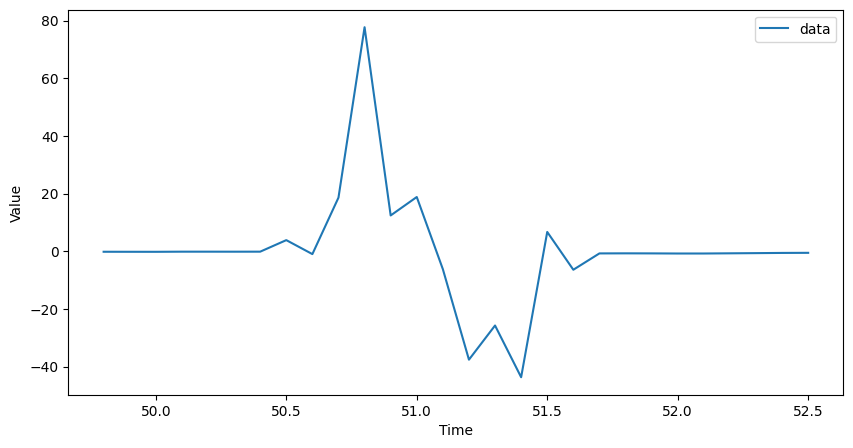

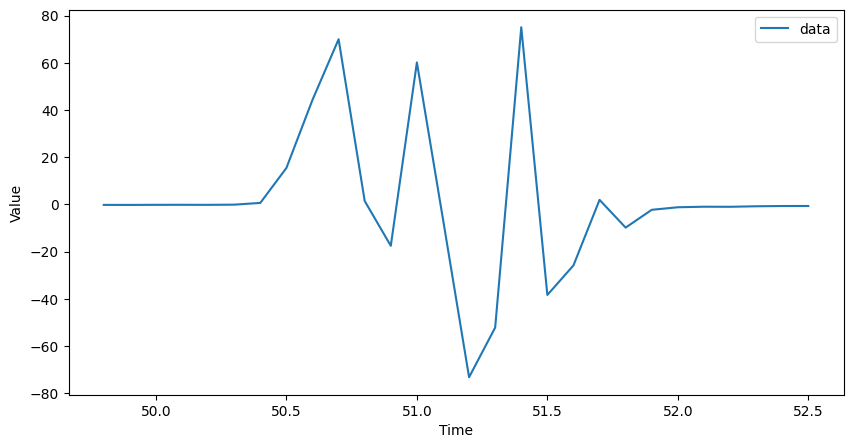

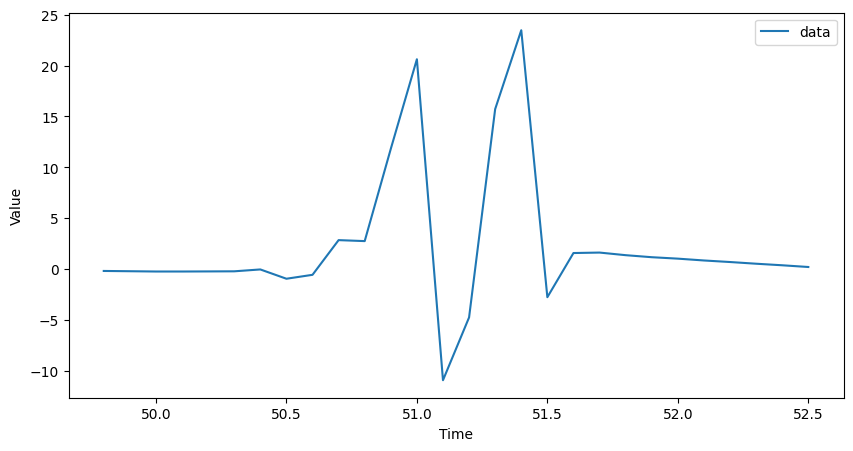

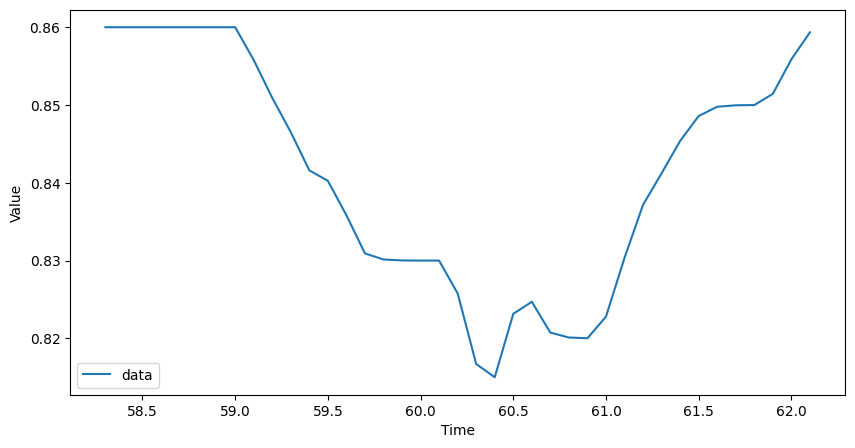

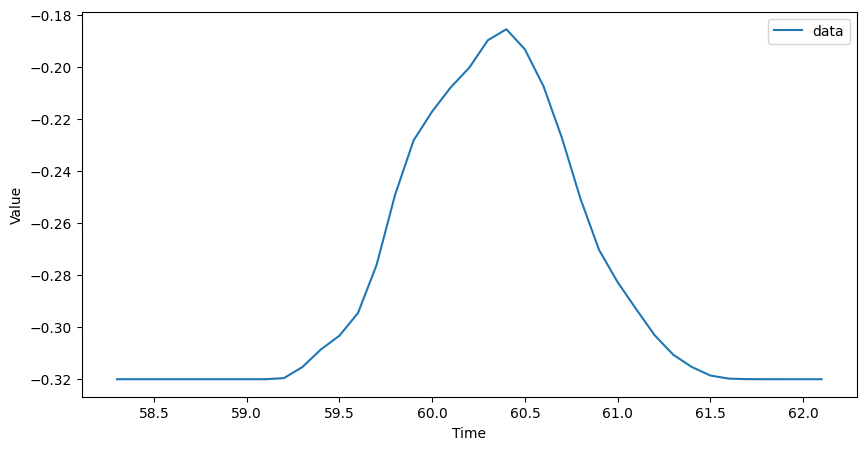

...

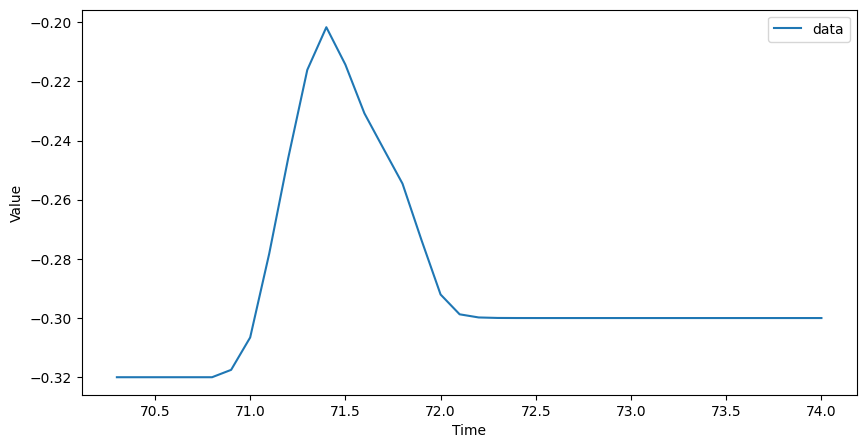

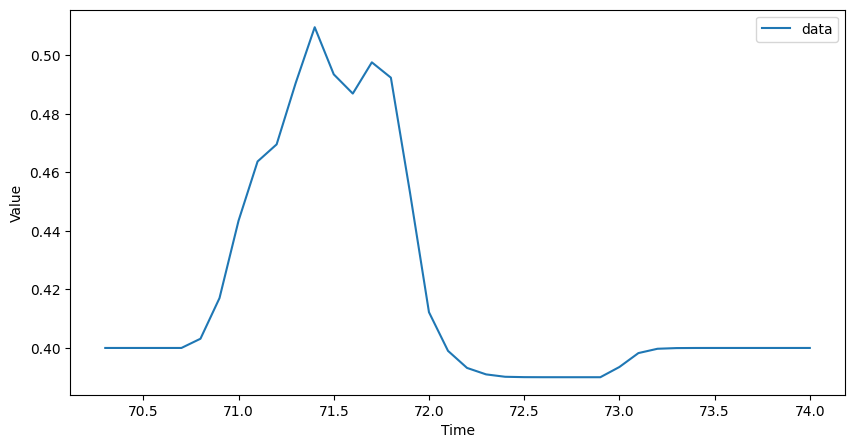

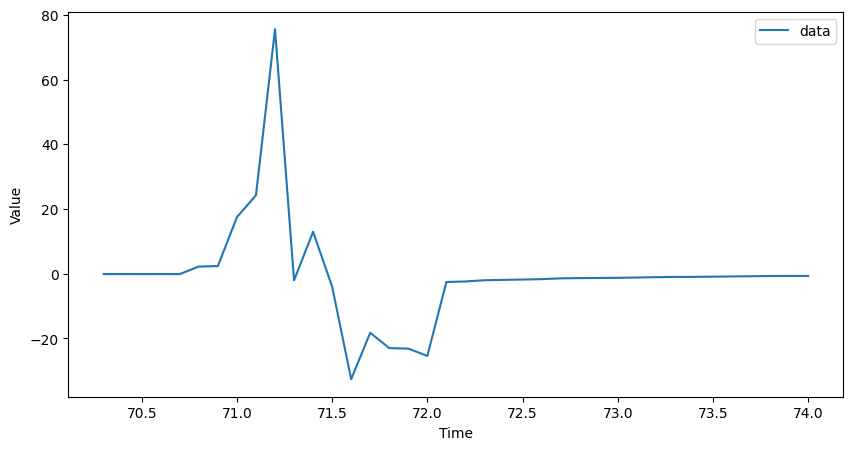

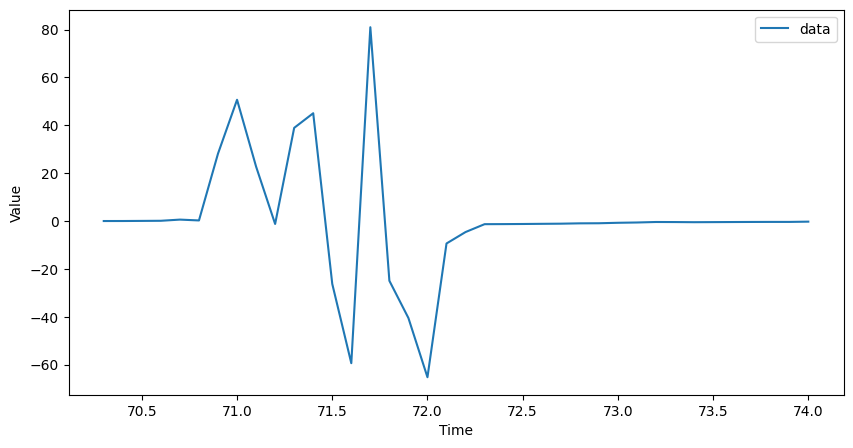

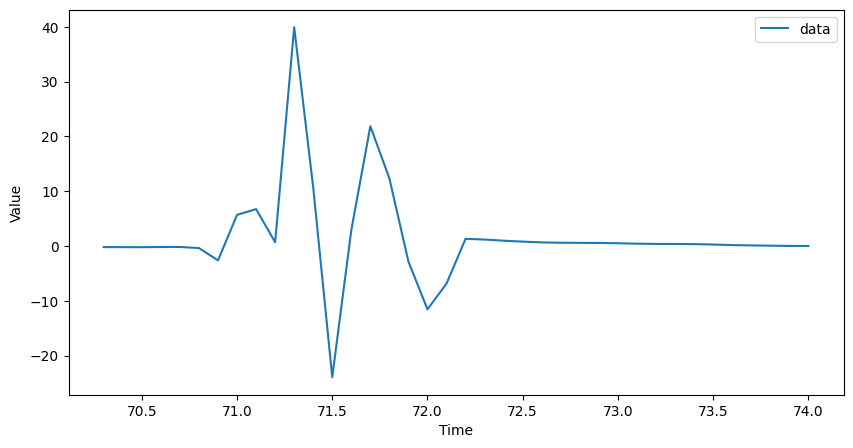

In [ ]:
folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Segments'

csv_files = [file for file in os.listdir(folder_path) if file.endswith('.csv')]

data_types = ['gyro_x', 'gyro_y', 'gyro_z', 'linear_x', 'linear_y', 'linear_z']

for csv_file in csv_files:
    file_path = os.path.join(folder_path, csv_file)
    df = pd.read_csv(file_path)

    for i in range(6):
      plot_data(df.iloc[:, i], df.iloc[:, 18])

Moving the segments into their proper classes

In [ ]:
import os
import shutil

# Folder path containing the CSV files
source_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Segments'

# Create a destination folder to store the grouped files
destination_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Session 3/Grouped Segments'
os.makedirs(destination_folder, exist_ok=True)

# Get a list of all files in the source folder
csv_files = [file for file in os.listdir(source_folder) if file.endswith('.csv')]

# Create a dictionary to store class names and their corresponding files
class_files_dict = {}

# List of class names
class_names = ['Elbow', 'Forearm', 'ShoulderAB', 'ShoulderEF',
               'ShoulderHor', 'ShoulderLat', 'ShoulderCircle', 'Wrist']  # Replace with your class names

# Function to extract the class name from the file name
def extract_class_name(filename):
    return next((class_name for class_name in class_names if class_name.lower() in filename.lower()), None)

# Iterate through each CSV file and copy them to the proper class-specific folders
for csv_file in csv_files:
    class_name = extract_class_name(csv_file)
    if class_name:
        class_folder = os.path.join(destination_folder, class_name)
        os.makedirs(class_folder, exist_ok=True)

        file_path = os.path.join(source_folder, csv_file)
        destination_path = os.path.join(class_folder, csv_file)
        shutil.copy(file_path, destination_path)
        print(f"Copied: {csv_file} to {class_name} folder")

print("Files have been copied into class-specific folders.")


Copied: IMU_Data_ID61_ShoulderEF1.csv_segment_1.csv to ShoulderEF folder
Copied: IMU_Data_ID61_ShoulderEF1.csv_segment_2.csv to ShoulderEF folder
Copied: IMU_Data_ID61_ShoulderEF1.csv_segment_3.csv to ShoulderEF folder
Copied: IMU_Data_ID61_ShoulderEF1.csv_segment_5.csv to ShoulderEF folder
Copied: IMU_Data_ID61_ShoulderEF1.csv_segment_6.csv to ShoulderEF folder
Copied: IMU_Data_ID61_Wrist.csv_segment_2.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_3.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_4.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_5.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_6.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_7.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_8.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_9.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_10.csv to Wrist folder
Copied: IMU_Data_ID61_Wrist.csv_segment_11.csv to Wrist folder
Copied: IMU_D

In [ ]:
import numpy as np

class Kalman_Filter(object):
    def __init__(self, F = None, B = None, H = None, Q = None, R = None, P = None, x0 = None):

        if(F is None or H is None):
            raise ValueError("Set proper system dynamics.")

        self.n = F.shape[1]
        self.m = H.shape[1]

        self.F = F
        self.H = H
        self.B = 0 if B is None else B
        self.Q = np.eye(self.n) if Q is None else Q
        self.R = np.eye(self.n) if R is None else R
        self.P = np.eye(self.n) if P is None else P
        self.x = np.zeros((self.n, 1)) if x0 is None else x0

    def predict(self, u = 0):
        self.x = np.dot(self.F, self.x) + np.dot(self.B, u)
        self.P = np.dot(np.dot(self.F, self.P), self.F.T) + self.Q
        return self.x

    def update(self, z):
        y = z - np.dot(self.H, self.x)
        S = self.R + np.dot(self.H, np.dot(self.P, self.H.T))
        K = np.dot(np.dot(self.P, self.H.T), np.linalg.inv(S))
        self.x = self.x + np.dot(K, y)
        I = np.eye(self.n)
        self.P = np.dot(np.dot(I - np.dot(K, self.H), self.P),
        	(I - np.dot(K, self.H)).T) + np.dot(np.dot(K, self.R), K.T)
from scipy.signal import butter, lfilter

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def peak_preservation(Z_old, predictions, Z_acc, window, data_type):
    '''
    Keeps important peak values in filtered signal

    Parameters:
    Z_old - original signal from sensor

    predictions - signal with more noise filtered out
    Z_acc - signal with less noise filtered out
    window - time window to set equal to noisier signal
    '''
    #set value of signal peaks to detect
    print(type(Z_old))

    if data_type < 3:
        detect = 15
    else:
        detect = 4
    #look for peaks in original signal and replace prediction values with higher accuracy kalman filtered signal
    for x in range(len(Z_old) - 3):
        if abs(Z_old[x]) >= detect and x != 0:
          start = x - int(window/2)
          if start < 0:
            start = 0
          for i in range (window):
              if start + i > len(Z_old):
                print(start + i, " > ", len(Z_old))
                break
              elif data_type < 3:
                predictions[start + i] = Z_old[start + i]
              else:
                predictions[start + i] = Z_acc[start + i]

    return predictions


def peak_preservation_real_time(Z_old, predictions, Z_acc, window, type):
    '''
    Keeps important peak values in filtered signal

    Parameters:
    Z_old - original signal from sensor

    predictions - signal with more noise filtered out
    Z_acc - signal with less noise filtered out
    window - time window to set equal to noisier signal
    '''
    #set value of signal peaks to detect
    if type < 3:
        detect = 30
    else:
        detect = 4

    #look for peaks in original signal and replace prediction values with higher accuracy kalman filtered signal
    for x in range(len(Z_old) - 3):

        if abs(Z_old[x] - Z_old[x - 1]) >= detect:
            for i in range (window):
                if x < len(Z_old) - window - 1:
                    if type < 3:
                        predictions[x + int(i - window/2)][0] = Z_acc[x + int(i - window/2)]
                    else:
                        predictions[x + int(i - int(window/2))][0] = Z_acc[x + int(i - int(window/2))][0]


def run_kalman(Z, dt, scaleQ, scaleR):
    '''
    Parameters:
    scaleQ - modifies Q (accuracy of the noisy model)
    scaleR - modifies R (accuracy of the sensor)
    Z - the original noisy signal
    dt - change in time

    Returns:
    predictions - filtered signal
    '''
    F = np.array([[1, dt, dt*dt/2], [0, 1, dt], [0, 0, 1]])
    H = np.array([1, 0, 0]).reshape(1, 3)
    Q = np.array([[0.05*scaleQ, 0.05, 0.0], [0.05*scaleQ, 0.05, 0.0], [0.0, 0.0, 0.0]])
    R = np.array([1/scaleR]).reshape(1, 1)

    x = np.linspace(-10, 10, 100)
    measurements = Z

    kf = Kalman_Filter(F = F, H = H, Q = Q, R = R)
    predictions = []

    for z in measurements:
        predictions.append(np.dot(H,  kf.predict())[0])
        kf.update(z)

    return predictions

#Segments

In [ ]:
import numpy as np
from numpy import diff

def reduce_array_size(array1, array2):
    size_diff = len(array1) - len(array2)
    if size_diff > 0:
        reduced_array1 = array1[:-size_diff]
        reduced_array2 = array2
    elif size_diff < 0:
        reduced_array1 = array1
        reduced_array2 = array2[:len(array1)]
    else:
        reduced_array1 = array1
        reduced_array2 = array2
    return reduced_array1, reduced_array2

def get_spikes(time_data, predictions, detect_sensitivity, detect_reduction, slope, threshold):
    '''
    Paramters:
    time_data - collected from IMU sensor
    predictions - signal to analyze
    detect_sensitivity - how sensitive the function is to large, sequential slopes
    detect_reduction - for furthur control of the function
    slope - slope value that causes a detection (changepoint)

    Returns:
    spikes - indices to time_data where detected changepoints occur
    '''
    #get slope of signal at all points
    dx = diff(time_data)
    dy = diff(predictions)

    dx, dy = reduce_array_size(dx, dy)

    deriv = np.divide(dy, dx)

    spikes = []
    detect_count = 0
    last_peak = -1

    for i in range (len(deriv) - 1):
        if abs(deriv[i]) > slope:
            detect_count = detect_count + 1
            if len(spikes) >= 1 and (i - spikes[len(spikes) - 1]) < detect_sensitivity*detect_count:
                last_peak = i
            else:
                detect_count = 1
                if last_peak != -1 and last_peak > spikes[len(spikes) - 1]:
                    spikes.append(last_peak)
                spikes.append(i)
        elif detect_count > 0:
            detect_count = detect_count*detect_reduction

    if len(spikes) > 0:
        if last_peak > spikes[len(spikes) - 1]:
            spikes.append(last_peak)

    spikes = movement_detection(deriv, spikes, threshold)

    spikes = np.asarray(spikes)

    return spikes

def movement_detection(deriv, spikes, threshold):
    average = 0
    previous = 0
    to_remove = []

    for i in range(len(spikes) - 1):
        #print(spikes[i])
        #print(average_slope(deriv, (spikes[i]), spikes[i + 1]))
        average = abs(average_slope(deriv, spikes[i], spikes[i + 1]))
        if average > threshold:
            average = 1
        else:
            average = 0
        if average == previous:
            to_remove.append(i)

        previous = average

    #print(to_remove)
    spikes = np.delete(spikes, to_remove, axis=0)
    if len(spikes)%2 != 0:
        spikes = spikes[:-1]

    return spikes


def average_slope(deriv, start, end):
    sum = 0
    for i in range (end - start):
        sum = sum + abs(deriv[i + start])

    average = sum/(end-start)
    return average

def combine_segments(signal1, signal2, signal3, signal4, signal5, signal6):
    tuples1 = [(signal1[i], signal1[i+1]) for i in range(0, len(signal1), 2)]
    tuples2 = [(signal2[i], signal2[i+1]) for i in range(0, len(signal2), 2)]
    tuples3 = [(signal3[i], signal3[i+1]) for i in range(0, len(signal3), 2)]
    tuples4 = [(signal4[i], signal4[i+1]) for i in range(0, len(signal4), 2)]
    tuples5 = [(signal5[i], signal5[i+1]) for i in range(0, len(signal5), 2)]
    tuples6 = [(signal6[i], signal6[i+1]) for i in range(0, len(signal6), 2)]

    tuples = sorted(tuples1 + tuples2 + tuples3 + tuples4 + tuples5 + tuples6)
    print(tuples)
    return combine_overlapping_segments_2(tuples)

def combine_segments_three(signal1, signal2, signal3):
    tuples1 = [(signal1[i], signal1[i+1]) for i in range(0, len(signal1), 2)]
    tuples2 = [(signal2[i], signal2[i+1]) for i in range(0, len(signal2), 2)]
    tuples3 = [(signal3[i], signal3[i+1]) for i in range(0, len(signal3), 2)]

    tuples = sorted(tuples1 + tuples2 + tuples3)
    print(tuples)
    return combine_overlapping_segments_2(tuples)

def combine_segments_overlapping_three(segments):
    # Sort the segments based on their start points
    sorted_segments = sorted(segments, key=lambda x: x[0])

    merged_segments = []
    current_segment = sorted_segments[0]

    for segment in sorted_segments[1:]:
        if segment[0] <= current_segment[1]:  # Overlapping segments
            current_segment = (current_segment[0], max(segment[1], current_segment[1]))
        else:  # Non-overlapping segments
            merged_segments.append(current_segment)
            current_segment = segment

    # Add the last segment
    merged_segments.append(current_segment)

    print(merged_segments)
    merged_segments = np.array([list(map(int, tpl)) for tpl in merged_segments]).flatten()

    mask = merged_segments >= 40
    if(len(mask) > 1 and mask[0] == False and mask[1] == False):
        merged_segments = merged_segments[mask]
    elif(len(mask) > 1 and mask[0] == False and mask[1] == True):
        merged_segments[0] = sorted_segments[0][0]
    print(mask)

    print(merged_segments)

    return merged_segments


def combine_segments_overlapping(segments):
    # Sort the segments based on their start points
    sorted_segments = sorted(segments, key=lambda x: x[0])

    merged_segments = []
    current_segment = sorted_segments[0]

    lowest_index = segment[0]

    for segment in sorted_segments[1:]:
        if segment[0] > 20 and (lowest_index == 0 or segment[0] < lowest_index):
            lowest_index = segment[0]
        if segment[0] <= current_segment[1]:  # Overlapping segments
            current_segment = (current_segment[0], max(segment[1], current_segment[1]))
        else:  # Non-overlapping segments
            merged_segments.append(current_segment)
            current_segment = segment

    # Add the last segment
    merged_segments.append(current_segment)

    print(merged_segments)
    merged_segments = np.array([list(map(int, tpl)) for tpl in merged_segments]).flatten()

    mask = merged_segments >= 40
    if(len(mask) > 1 and mask[0] == False and mask[1] == False):
        merged_segments = merged_segments[mask]
    elif(len(mask) > 1 and mask[0] == False and mask[1] == True):
        merged_segments[0] = lowest_index
    print(mask)

    print(len(merged_segments))

    return merged_segments

def combine_overlapping_segments_2(segments):
    if not segments:
        return []

    segments = sorted(segments)
    merged_segments = [segments[0]]

    for segment in segments[1:]:
        if segment[0] <= merged_segments[-1][1]:
            merged_segments[-1] = (merged_segments[-1][0], max(segment[1], merged_segments[-1][1]))
        else:
            merged_segments.append(segment)

    return np.concatenate(merged_segments)


In [ ]:
import os
import shutil
import pandas as pd

folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/Classified Data (3 Sensors)/Interpolated Data/sensor 61'



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Specify the path to the CSV file
csv_file_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/IMU data/IMU_Data_ID59_03.csv'
# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

time_data = df.iloc[:, 6].values

results = []

for i in range(3):
  results.append(get_spikes(time_data, df.iloc[:, i].values, 10, 0.95, 1, 1))

for i in range(3):
  time, data, segments_temp = filter_and_seg(i + 3, df.iloc[:, i + 3].values, df.iloc[:, 6])
  results.append(segments_temp)

overall_segments59 = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

print(results)
print(overall_segments59)

result:  [204 216 397 400 472 474]
result:  [204 215 360 362 397 400 472 474]
result:  [204 217]
[(204, 215), (204, 216), (204, 217), (360, 362), (397, 400), (397, 400), (472, 474), (472, 474)]
[(204, 217), (360, 362), (397, 400), (472, 474)]
[ True  True  True  True  True  True  True  True]
[204 217 360 362 397 400 472 474]
[array([], dtype=float64), array([], dtype=float64), array([], dtype=float64), array([204, 216, 397, 400, 472, 474]), array([204, 215, 360, 362, 397, 400, 472, 474]), array([204, 217])]
[204 217 360 362 397 400 472 474]


In [ ]:
# Specify the path to the CSV file
csv_file_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/IMU data/IMU_Data_ID60_03.csv'
# Read the CSV file into a pandas DataFrame
df = pd.read_csv(csv_file_path)

time_data = df.iloc[:, 6].values

results = []

for i in range(3):
  results.append(get_spikes(time_data, df.iloc[:, i].values, 10, 0.95, 1, 1))

for i in range(3):
  time, data, segments_temp = filter_and_seg(i + 3, df.iloc[:, i + 3].values, df.iloc[:, 6])
  results.append(segments_temp)

overall_segments60 = combine_segments(results[0], results[1], results[2], results[3], results[4], results[5])

print(results)
print(overall_segments60)

result:  [202 220 264 283 315 318 343 600]
result:  [202 219 236 240 269 283 307 318 343 600]
result:  [203 600]
[(202, 219), (202, 220), (203, 600), (236, 240), (264, 283), (269, 283), (307, 318), (315, 318), (343, 600), (343, 600)]
[(202, 600)]
[ True  True]
[202 600]
[array([], dtype=int64), array([], dtype=int64), array([], dtype=int64), array([202, 220, 264, 283, 315, 318, 343, 600]), array([202, 219, 236, 240, 269, 283, 307, 318, 343, 600]), array([203, 600])]
[202 600]


In [ ]:
overall_segments = combine_segments_three(overall_segments30, overall_segments59, overall_segments60)

[(25, 93), (142, 161), (201, 218), (202, 600), (204, 217), (360, 362), (397, 400), (436, 443), (472, 474), (591, 595)]
[(25, 93), (142, 161), (201, 600)]
[False  True  True  True  True  True]
[ 25  93 142 161 201 600]


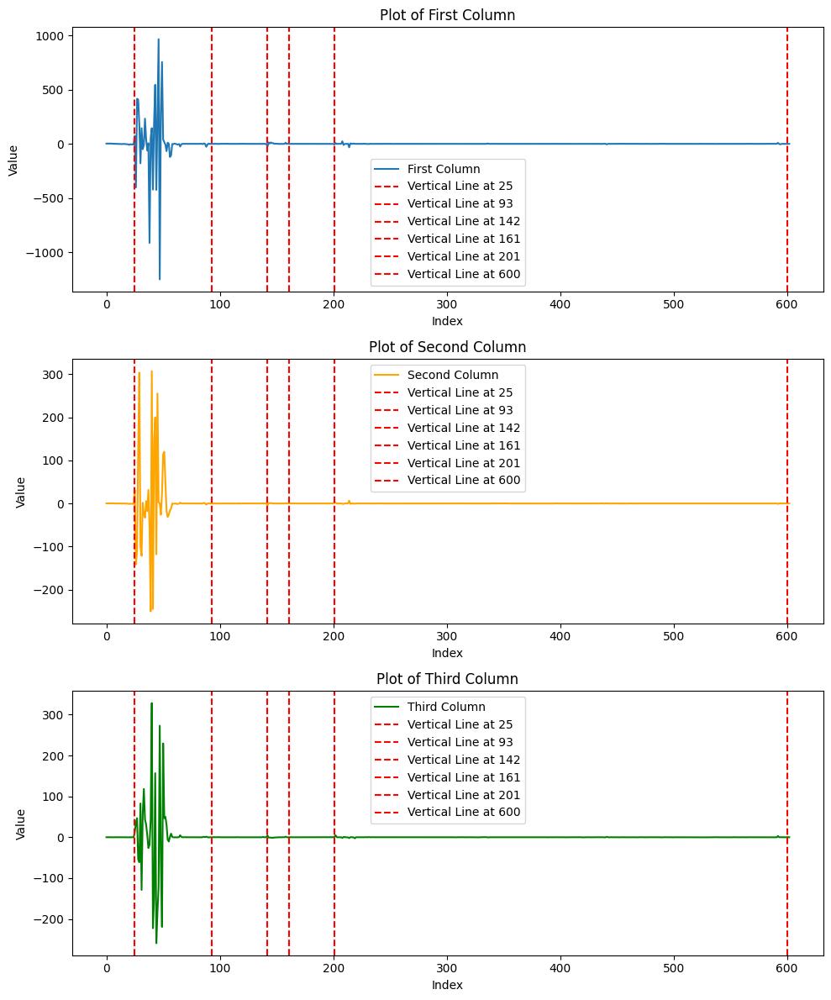

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

# Extract the data from the first, second, and seventh columns
first_column_data = df.iloc[:, 4]
second_column_data = df.iloc[:, 3]
third_column_data = df.iloc[:, 5]

# Specify the x values (time in seconds) for vertical lines
vertical_lines_x = overall_segments
#for i in range(len(overall_segments)):
#  vertical_lines_x.append(df['Time'][overall_segments[i]])

# Create subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 12))

# Plot for the first column
ax1.plot(first_column_data, label='First Column')
ax1.set_xlabel('Index')
ax1.set_ylabel('Value')
ax1.set_title('Plot of First Column')
ax1.legend()

# Plot for the second column
ax2.plot(second_column_data, label='Second Column', color='orange')
ax2.set_xlabel('Index')
ax2.set_ylabel('Value')
ax2.set_title('Plot of Second Column')
ax2.legend()

# Plot for the third column
ax3.plot(third_column_data, label='Third Column', color='green')
ax3.set_xlabel('Index')
ax3.set_ylabel('Value')
ax3.set_title('Plot of Third Column')
ax3.legend()

# Add vertical lines
for ax in [ax1, ax2, ax3]:
    for line_x in vertical_lines_x:
        ax.axvline(x=line_x, color='red', linestyle='--', label=f'Vertical Line at {line_x}')
    ax.legend()

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

Combining 3 files

In [ ]:
import pandas as pd
import shutil
import os

# Read the CSV files into dataframes
df1 = pd.read_csv('/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/IMU data/IMU_Data_ID30_03.csv')
df2 = pd.read_csv('/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/IMU data/IMU_Data_ID59_03.csv')
df3 = pd.read_csv('/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/IMU data/IMU_Data_ID60_03.csv')

# Extract the first 6 columns from each dataframe
df1_subset = df1.iloc[:, :6]
df2_subset = df2.iloc[:, :6]
df3_subset = df3.iloc[:, :6]

# Combine the subsets along the columns
result = pd.concat([df1_subset, df2_subset, df3_subset], axis=1)

# Add the last column of the first dataframe to the result
result['Last_Column'] = df1.iloc[:, -1]

# Write the combined dataframe to a new CSV file
result.to_csv('combined.csv', index=False)

# Create a folder and move 'combined.csv' into it
folder_path = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/preprocessed imu data temp'  # Replace 'my_folder' with the desired folder name
os.makedirs(folder_path, exist_ok=True)
shutil.move('combined.csv', os.path.join(folder_path, 'combined.csv'))

'/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/preprocessed imu data temp/combined.csv'

In [ ]:
import os
import pandas as pd

# Function to print and save a range of rows to a CSV file
def print_and_save_csv_rows(data, start_row, end_row, dest_folder, filename):
    df = data.iloc[start_row:end_row+1]  # Extract the specified range of rows
    save_path = os.path.join(dest_folder, filename)  # Create the destination file path
    df.to_csv(save_path, index=False)  # Save the extracted data to a new CSV file

# Replace 'main_folder' and 'dest_folder' with the actual paths to the source and destination folders
main_folder = folder_path
dest_folder = '/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/segments'

files = os.listdir(main_folder)
i = 0

int_segments = []
int_segments.append(overall_segments.tolist())

for file in files:
    data = pd.read_csv(os.path.join(main_folder, file))
    if len(int_segments[i]) % 2 == 0:
        for j in range(len(int_segments[i]) // 2):
            start_row = int_segments[i][2 * j]
            end_row = int_segments[i][2 * j + 1]
            print("start: ", start_row, "end: ", end_row)
            # Save the extracted range to a CSV file
            dest_filename = f"{file}_range{j}.csv"
            print_and_save_csv_rows(data, start_row, end_row, dest_folder, dest_filename)

    i += 1


start:  25 end:  93
start:  142 end:  161
start:  201 end:  600


In [ ]:
import pandas as pd

def split_csv_file(input_file, folder_name, output_folder, chunk_size=20):
    # Read the original CSV file into a DataFrame
    df = pd.read_csv(input_file)

    # Calculate the number of chunks needed
    num_chunks = (len(df) + chunk_size - 1) // chunk_size

    # Split the DataFrame into chunks and save each chunk as a new CSV file
    num = 0
    for i in range(num_chunks):
        start_idx = i * chunk_size
        end_idx = min(start_idx + chunk_size, len(df))

        # If the chunk size is less than 20, fill the remaining rows with zeros
        if end_idx - start_idx < chunk_size:
            num_rows_to_add = chunk_size - (end_idx - start_idx)
            zeros_df = pd.DataFrame([[0] * df.shape[1]] * num_rows_to_add, columns=df.columns)
            df_chunk = pd.concat([df.iloc[start_idx:end_idx], zeros_df])
        else:
            df_chunk = df.iloc[start_idx:end_idx]

        # Save the chunk as a new CSV file
        output_file = os.path.join(output_folder, f"{folder_name}_segment_{i + 1}.csv")
        df_chunk.to_csv(output_file, index=False)
        num+=1
    print(num, "chunks")

# Set your input and output folder paths here
input_folder = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/interpolated segments"
output_folder = "/content/gdrive/MyDrive/Third Year/Summer 2023/Summer Research/3 sensors/preprocessed imu data"

# Create output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Assuming all CSV files are in the input folder
csv_files = [file for file in os.listdir(input_folder) if file.endswith(".csv")]

for file in csv_files:
    print(file)
    input_file = os.path.join(input_folder, file)
    split_csv_file(input_file, file, output_folder)


combined.csv_range0.csv
5 chunks
combined.csv_range1.csv
2 chunks
combined.csv_range2.csv
26 chunks
